# Project2

## Data preparation

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import time
import datetime
import numpy as np
import seaborn as sns
from scipy import stats
from colorama import Fore, Style

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import xgboost
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

In [3]:
crypto_data_folder = './g-research-crypto-forecasting/'

crypto_data = pd.read_csv(crypto_data_folder + 'train.csv')

asset_data = pd.read_csv(crypto_data_folder + 'asset_details.csv')

In [4]:
def get_initial_asset(asset_id, data = crypto_data):
    df = data[data['Asset_ID'] == asset_id].reset_index(drop = True)
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')
    df = df.set_index('timestamp')
    return df

In [5]:
def prep_train_data(data, asset_id):
    train_df = pd.DataFrame(index=data.index)
    for i in range (16):
        train_df[str(asset_id) + '_f1_' + str(i)] = data.Close.shift(i) / data.Close
        train_df[str(asset_id) + '_f2_' + str(i)] = (data.Close.shift(i) - data.Open.shift(i)) / data.Close
        train_df[str(asset_id) + '_f3_' + str(i)] = (data.High.shift(i) - data.Low.shift(i)) / data.Close
        train_df[str(asset_id) + '_f4_' + str(i)] = data.Volume.shift(i) / data.Volume
        train_df[str(asset_id) + '_f5_' + str(i)] = data.VWAP.shift(i) / data.VWAP
        train_df[str(asset_id) + '_f6_' + str(i)] = data.VWAP.shift(i) / data.Close
    train_df['Target'] = (data.Close.shift(-15) - data.Close) / data.Close
    train_df['Target_new'] = np.log(data.Close.shift(-15) / data.Close)
    w = ['1H', '3H', '6H', '9H', '12H', '24H']
    for i in w:
        train_df[str(asset_id) + '_w1_' + str(i)] = data.VWAP.rolling(i).mean() / data.Close
        train_df[str(asset_id) + '_w2_' + str(i)] = data.Count.rolling(i).mean() / data.Count
        train_df[str(asset_id) + '_w3_' + str(i)] = data.Volume.rolling(i).mean() / data.Volume
        train_df[str(asset_id) + '_w4_' + str(i)] = data.Close.rolling(i).min() / data.Close
        train_df[str(asset_id) + '_w5_' + str(i)] = data.Close.rolling(i).max() / data.Close
        train_df[str(asset_id) + '_w6_' + str(i)] = data.VWAP.rolling(i).std() / data.Close
        train_df[str(asset_id) + '_w7_' + str(i)] = data.Count.rolling(i).std() / data.Count
        train_df[str(asset_id) + '_w8_' + str(i)] = data.Volume.rolling(i).std() / data.Volume
        train_df[str(asset_id) + '_w9_' + str(i)] = data.Close.rolling(i).std() / data.Close
    return train_df

In [6]:
# binance_coin = prep_train_data(get_initial_asset(asset_id=0), asset_id=0)
bitcoin_raw = get_initial_asset(asset_id=1)
bitcoin = prep_train_data(bitcoin_raw, asset_id=1)
# bitcoin_cash = prep_train_data(get_initial_asset(asset_id=2), asset_id=2)
# cardano = prep_train_data(get_initial_asset(asset_id=3), asset_id=3)
# dogecoin = prep_train_data(get_initial_asset(asset_id=4), asset_id=4)
# eos_io = prep_train_data(get_initial_asset(asset_id=5), asset_id=5)
# ethereum = prep_train_data(get_initial_asset(asset_id=6), asset_id=6)
# ethereum_classic = prep_train_data(get_initial_asset(asset_id=7), asset_id=7)
# iota = prep_train_data(get_initial_asset(asset_id=8), asset_id=8)
# litecoin = prep_train_data(get_initial_asset(asset_id=9), asset_id=9)
# maker = prep_train_data(get_initial_asset(asset_id=10), asset_id=10)
# monero = prep_train_data(get_initial_asset(asset_id=11), asset_id=11)
# stellar = prep_train_data(get_initial_asset(asset_id=12), asset_id=12)
# tron = prep_train_data(get_initial_asset(asset_id=13), asset_id=13

data_raw = bitcoin_raw
data = bitcoin

C:\Users\Crews\AppData\Local\Temp/ipykernel_2512/3856921918.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df[str(asset_id) + '_w3_' + str(i)] = data.Volume.rolling(i).mean() / data.Volume
C:\Users\Crews\AppData\Local\Temp/ipykernel_2512/3856921918.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df[str(asset_id) + '_w4_' + str(i)] = data.Close.rolling(i).min() / data.Close
C:\Users\Crews\AppData\Local\Temp/ipykernel_2512/3856921918.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usual

In [16]:
crypto_data.head()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40.0,2376.5800,2399.5000,2357.1400,2374.5900,19.233005,2373.116392,-0.004218
1,1514764860,0,5.0,8.5300,8.5300,8.5300,8.5300,78.380000,8.530000,-0.014399
2,1514764860,1,229.0,13835.1940,14013.8000,13666.1100,13850.1760,31.550062,13827.062093,-0.014643
3,1514764860,5,32.0,7.6596,7.6596,7.6567,7.6576,6626.713370,7.657713,-0.013922
4,1514764860,7,5.0,25.9200,25.9200,25.8740,25.8770,121.087310,25.891363,-0.008264


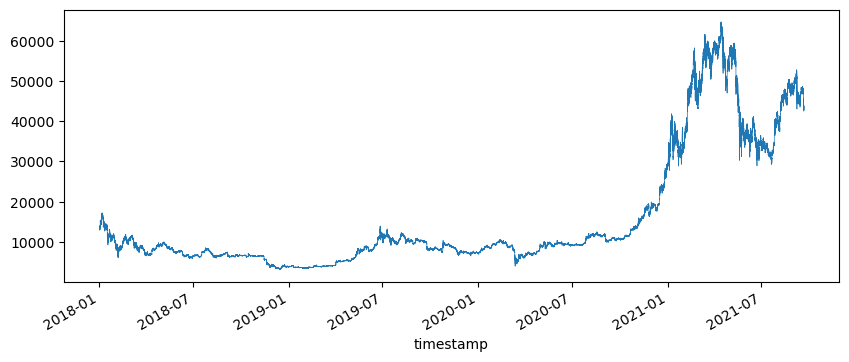

In [24]:
plt.rcParams.update({'figure.figsize':(10,4), 'figure.dpi':100})

data_raw['Close'].plot(linewidth=0.5)

plt.show()

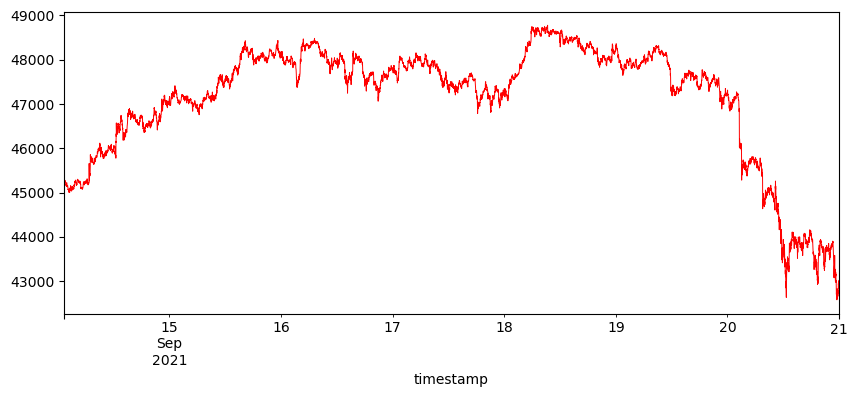

In [27]:
plt.rcParams.update({'figure.figsize':(10,4), 'figure.dpi':100})

data_raw['Close'].tail(10000).plot(linewidth=0.7, color='r')

plt.show()

In [7]:
data = data.tail(10016)
data.drop(data.tail(16).index, inplace=True)
print('Any null data: ', data.isna().values.any())
Y = pd.DataFrame(data.Target, index=data.index)
Y_new = pd.DataFrame(data.Target_new, index=data.index)
X = data.drop(['Target', 'Target_new'], axis=1)
data

Any null data:  False


C:\Users\Crews\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,1_f1_0,1_f2_0,1_f3_0,1_f4_0,1_f5_0,1_f6_0,1_f1_1,1_f2_1,1_f3_1,1_f4_1,...,1_w9_12H,1_w1_24H,1_w2_24H,1_w3_24H,1_w4_24H,1_w5_24H,1_w6_24H,1_w7_24H,1_w8_24H,1_w9_24H
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-09-14 01:05:00,1.0,0.000389,0.001442,1.0,1.0,0.999842,0.999522,-0.000737,0.002067,2.908787,...,0.010008,0.991394,2.778521,4.502733,0.964798,1.034271,0.008350,3.572113,8.153780,0.008332
2021-09-14 01:06:00,1.0,-0.000227,0.001522,1.0,1.0,1.000217,1.000132,0.000389,0.001442,0.616005,...,0.010015,0.991512,2.204167,2.773469,0.964925,1.034408,0.008324,2.834302,5.022847,0.008305
2021-09-14 01:07:00,1.0,0.000338,0.001123,1.0,1.0,0.999726,0.999816,-0.000227,0.001521,1.428480,...,0.010018,0.991317,2.349290,3.960121,0.964747,1.034217,0.008296,3.022360,7.175451,0.008278
2021-09-14 01:08:00,1.0,-0.000324,0.001155,1.0,1.0,1.000136,1.000149,0.000338,0.001123,1.571972,...,0.010024,0.991453,2.636252,6.223376,0.964891,1.034371,0.008272,3.392978,11.280237,0.008255
2021-09-14 01:09:00,1.0,-0.000135,0.001173,1.0,1.0,0.999927,1.000148,-0.000324,0.001155,0.677697,...,0.010029,0.991588,2.430851,4.216544,0.965034,1.034525,0.008249,3.129532,7.644910,0.008231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-20 23:40:00,1.0,0.001667,0.003030,1.0,1.0,0.998815,0.998442,-0.002880,0.005667,1.081811,...,0.007374,1.046376,1.070004,1.140317,0.997035,1.107947,0.028631,1.055782,1.580515,0.028628
2021-09-20 23:41:00,1.0,0.001476,0.003005,1.0,1.0,0.999388,0.998169,0.001664,0.003025,1.320372,...,0.007398,1.044387,1.240230,1.506145,0.995209,1.105918,0.028560,1.223154,2.086659,0.028556
2021-09-20 23:42:00,1.0,-0.000405,0.003189,1.0,1.0,0.999848,1.000617,0.001477,0.003006,0.650094,...,0.007444,1.044959,1.071222,0.979628,0.995823,1.106600,0.028559,1.055851,1.356404,0.028556


In [8]:
X_train, X_test, Y_train, Y_test, Y_new_train, Y_new_test = train_test_split(X, Y, Y_new, test_size=0.4, shuffle=False)
X_val, X_test, Y_val, Y_test, Y_new_val, Y_new_test = train_test_split(X_test, Y_test, Y_new_test, test_size=0.5, shuffle=False)
print('All data size: %d' % X.size)
print('Train data size: %d' % X_train.size)
print('Validation data size: %d' % X_val.size)
print('Test data size: %d' % X_test.size)

All data size: 1500000
Train data size: 900000
Validation data size: 300000
Test data size: 300000


In [9]:
Y_new_train_small = Y_new_train.tail(1000)
Y_train_small = Y_train.tail(1000)

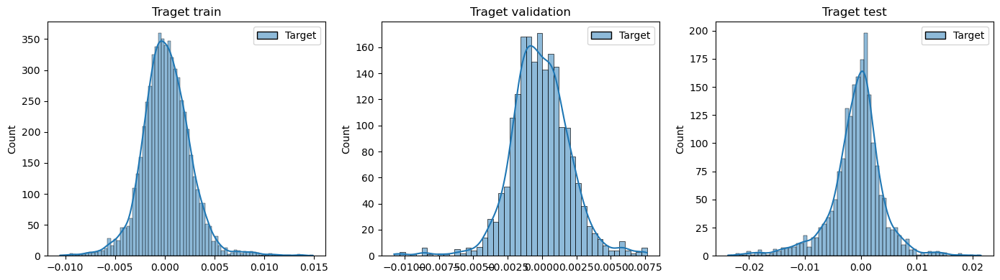

In [11]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=Y_train, ax=axes[0], kde=True)
sns.histplot(data=Y_val, ax=axes[1], kde=True)
sns.histplot(data=Y_test, ax=axes[2], kde=True)

axes[0].set_title('Traget train')
axes[1].set_title('Traget validation')
axes[2].set_title('Traget test')

plt.tight_layout()
plt.show()

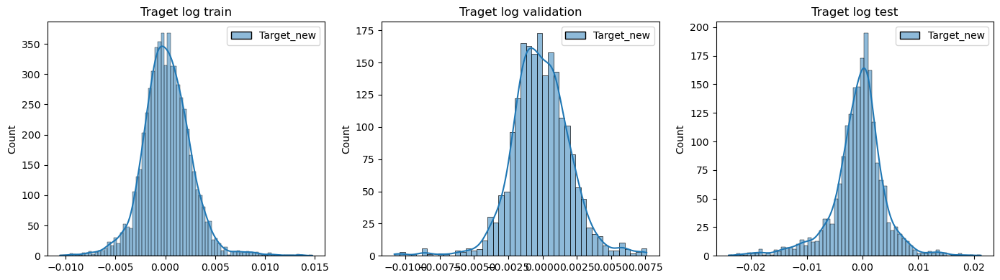

In [12]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=Y_new_train, ax=axes[0], kde=True)
sns.histplot(data=Y_new_val, ax=axes[1], kde=True)
sns.histplot(data=Y_new_test, ax=axes[2], kde=True)

axes[0].set_title('Traget log train')
axes[1].set_title('Traget log validation')
axes[2].set_title('Traget log test')

plt.tight_layout()
plt.show()

## Default model

In [9]:
start = time.time()
model_default = xgboost.XGBRegressor()
model_default.fit(X_train, Y_train)
model_default_time = time.time() - start

In [10]:
model_default.save_model('models/default.json')

In [11]:
pred_train_default = model_default.predict(X_train)
pred_val_default = model_default.predict(X_val)
pred_test_default = model_default.predict(X_test)

pred_train_series_default = pd.Series(pred_train_default, index=Y_train.index)
pred_val_series_default = pd.Series(pred_val_default, index=Y_val.index)
pred_test_series_default = pd.Series(pred_test_default, index=Y_test.index)

rmse_train_default = math.sqrt(mean_squared_error(Y_train, pred_train_default))
rmse_val_default = math.sqrt(mean_squared_error(Y_val, pred_val_default))
rmse_test_default = math.sqrt(mean_squared_error(Y_test, pred_test_default))

In [19]:
print('Execution time: ', datetime.timedelta(seconds=round(model_default_time)))
print('rmse train: ',  rmse_train_default)
print('rmse validation: ',  rmse_val_default)
print('rmse test: ',  rmse_test_default)

Execution time:  0:00:04
rmse train:  0.0004537663500626855
rmse validation:  0.003655485232859579
rmse test:  0.012544568631475527


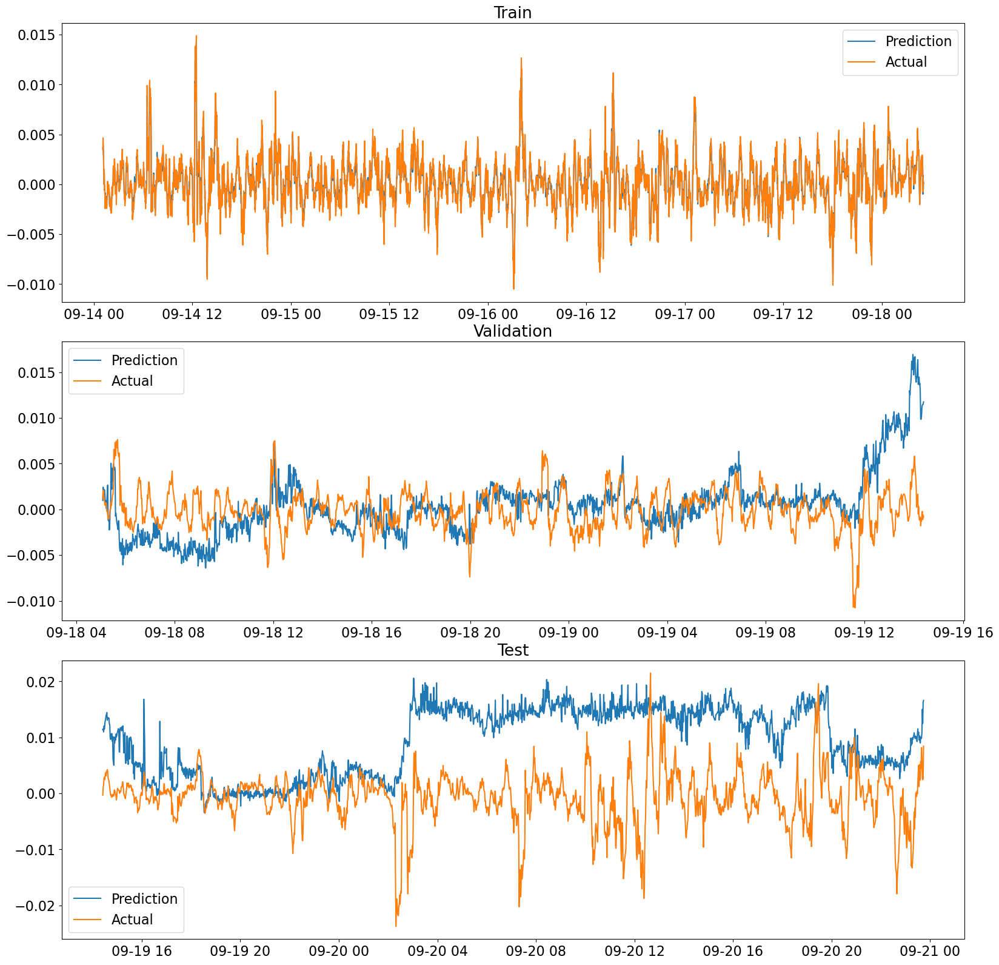

In [25]:
plt.rcParams.update({'figure.figsize':(16,16), 'figure.dpi':100, 'font.size':16})

fig, axes = plt.subplots(3, 1)
fig.tight_layout()

axes[0].plot(pred_train_series_default, label = 'Prediction')
axes[0].plot(Y_train, label = 'Actual')
axes[0].set_title('Train')
axes[0].legend()


axes[1].plot(pred_val_series_default, label = 'Prediction')
axes[1].plot(Y_val, label = 'Actual')
axes[1].set_title('Validation')
axes[1].legend()

axes[2].plot(pred_test_series_default, label = 'Prediction')
axes[2].plot(Y_test, label = 'Actual')
axes[2].set_title('Test')
axes[2].legend()

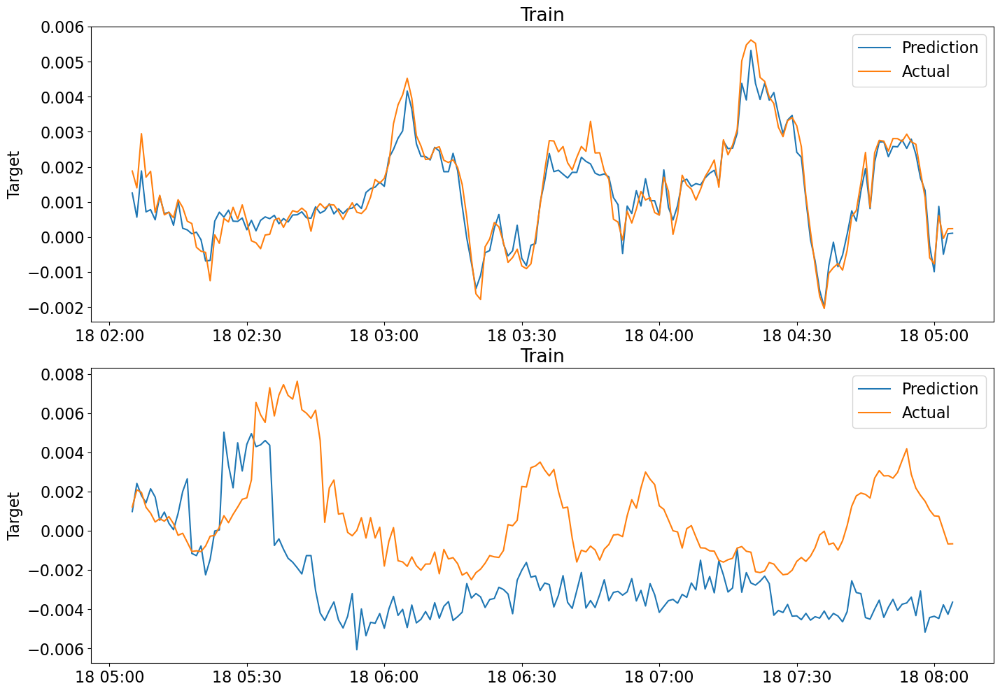

In [30]:
plt.rcParams.update({'figure.figsize': (14, 10), 'figure.dpi': 100, 'font.size':16})

pred_train_series_default_small = pred_train_series_default.tail(1000)

fig, axes = plt.subplots(2, 1)
fig.tight_layout()

axes[0].plot(pred_train_series_default.tail(180), label='Prediction')
axes[0].plot(Y_train.tail(180), label='Actual')
axes[0].set_title('Train')
axes[0].set_ylabel('Target')
axes[0].legend()

axes[1].plot(pred_val_series_default.head(180), label='Prediction')
axes[1].plot(Y_val.head(180), label='Actual')
axes[1].set_title('Train')
axes[1].set_ylabel('Target')
axes[1].legend()

plt.show()

In [32]:
residual_train_default = (pred_train_series_default - Y_train.Target) / Y_train.Target
residual_val_default = (pred_val_series_default - Y_val.Target) / Y_val.Target
residual_test_default = (pred_test_series_default - Y_test.Target) / Y_test.Target

residual_train_default_mean = residual_train_default.resample('1H').mean()
residual_val_default_mean = residual_val_default.resample('1H').mean()
residual_test_default_mean = residual_test_default.resample('1H').mean()

residual_train_default_std = residual_train_default.resample('1H').std()
residual_val_default_std = residual_val_default.resample('1H').std()
residual_test_default_std = residual_test_default.resample('1H').std()

Text(0.5, 1.0, 'test')

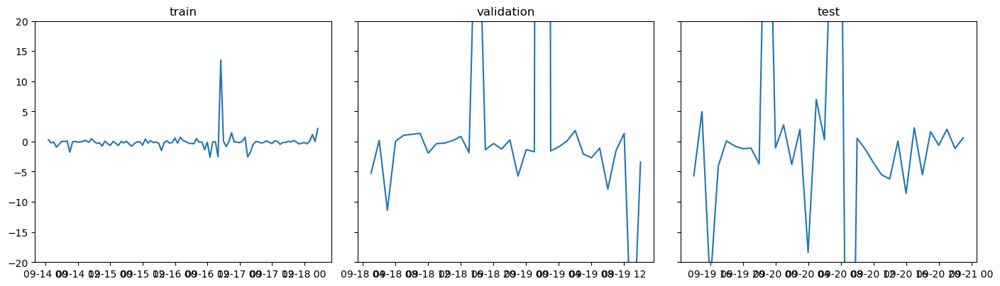

In [35]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

fig, axes = plt.subplots(1, 3, sharey=True)
fig.tight_layout()

axes[0].plot(residual_train_default_mean)
axes[1].plot(residual_val_default_mean)
axes[2].plot(residual_test_default_mean)

axes[0].set_ylim([-20, 20])
axes[0].set_title('train')
axes[1].set_title('validation')
axes[2].set_title('test')

Text(0.5, 1.0, 'test')

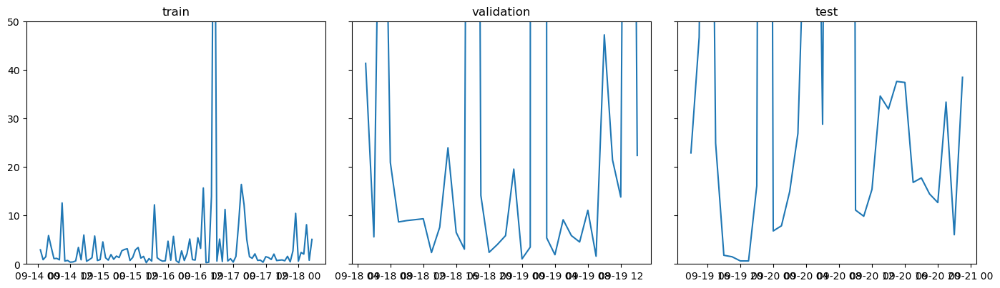

In [25]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

fig, axes = plt.subplots(1, 3, sharey=True)
fig.tight_layout()

axes[0].plot(residual_train_default_std)
axes[1].plot(residual_val_default_std)
axes[2].plot(residual_test_default_std)

axes[0].set_ylim([0, 50])
axes[0].set_title('train')
axes[1].set_title('validation')
axes[2].set_title('test')

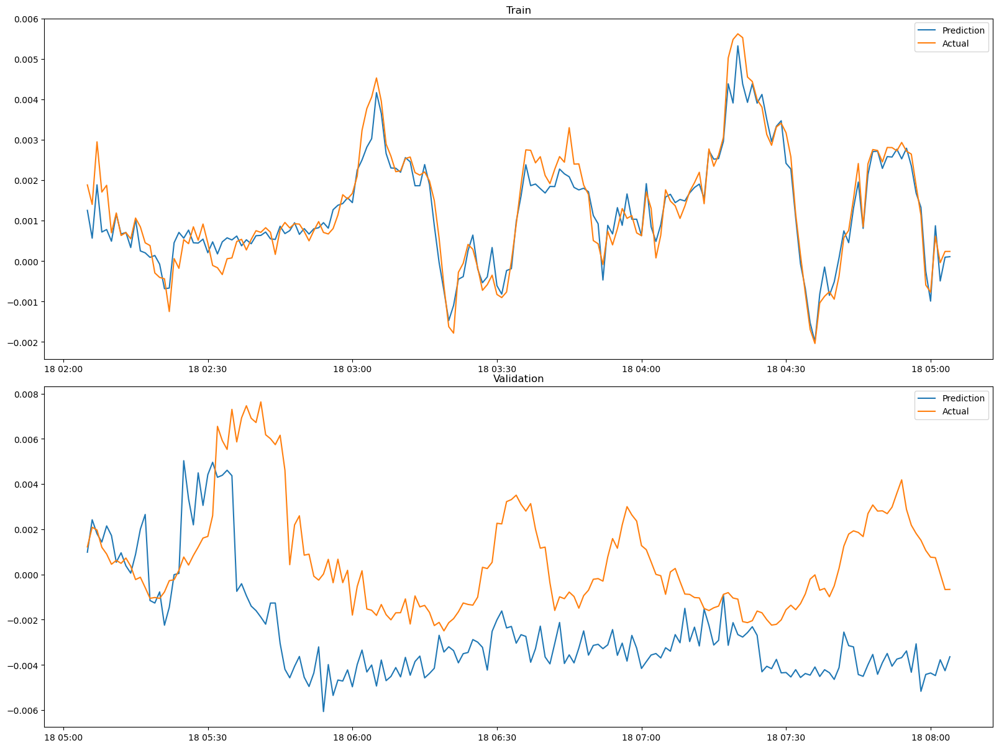

In [21]:
plt.rcParams.update({'figure.figsize':(16,12), 'figure.dpi':100})

pred_train_series_default_small2 = pred_train_series_default.tail(180)
pred_val_series_default_small2 = pred_val_series_default.head(180)

fig, axes = plt.subplots(2, 1)
fig.tight_layout()

axes[0].plot(pred_train_series_default_small2, label = 'Prediction')
axes[0].plot(Y_train.tail(180), label = 'Actual')
axes[0].set_title('Train')
axes[0].legend()


axes[1].plot(pred_val_series_default_small2, label = 'Prediction')
axes[1].plot(Y_val.head(180), label = 'Actual')
axes[1].set_title('Validation')
axes[1].legend()

In [27]:
print("*===Default params list===*")
params = model_default.get_params()
for param in params:
    print(param, ": ", params[param])

*===Default params list===*
objective :  reg:squarederror
base_score :  0.5
booster :  gbtree
colsample_bylevel :  1
colsample_bynode :  1
colsample_bytree :  1
enable_categorical :  False
gamma :  0
gpu_id :  -1
importance_type :  None
interaction_constraints :  
learning_rate :  0.300000012
max_delta_step :  0
max_depth :  6
min_child_weight :  1
missing :  nan
monotone_constraints :  ()
n_estimators :  100
n_jobs :  8
num_parallel_tree :  1
predictor :  auto
random_state :  0
reg_alpha :  0
reg_lambda :  1
scale_pos_weight :  1
subsample :  1
tree_method :  exact
validate_parameters :  1
verbosity :  None


In [18]:
print("*===Default model results===*")
print("train score: ", rmse_train_default)
print("validation score: ", rmse_val_default)
print("test score: ", rmse_test_default)
print("Execution time: ", datetime.timedelta(seconds=round(model_default_time)))

*===Default model results===*
train score:  0.0004537663500626855
validation score:  0.003655485232859579
test score:  0.012544568631475527
Execution time:  0:00:05


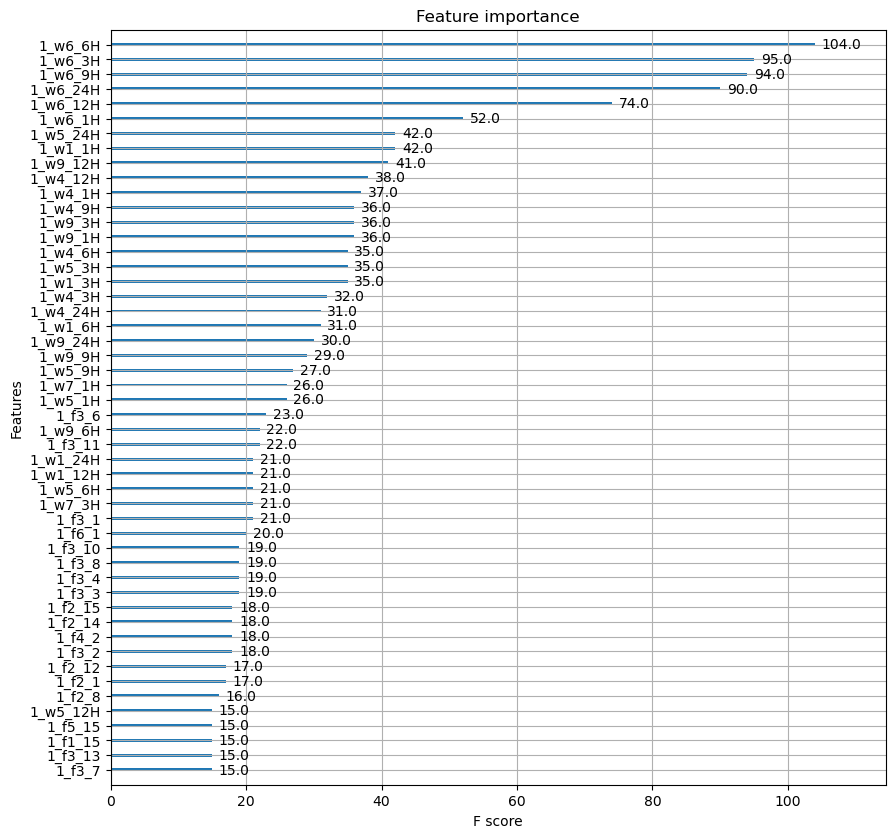

In [22]:
ax = xgboost.plot_importance(model_default, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

#### Test model

In [29]:
model_2 = xgboost.XGBRegressor(eta=0.01, n_estimators=700)
model_2.fit(X_train, Y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             eta=0.01, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.00999999978,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=700, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [30]:
pred_train_2 = model_2.predict(X_train)
pred_val_2 = model_2.predict(X_val)
pred_test_2 = model_2.predict(X_test)

pred_train_series_2 = pd.Series(pred_train_2, index=Y_train.index)
pred_val_series_2 = pd.Series(pred_val_2, index=Y_val.index)
pred_test_series_2 = pd.Series(pred_test_2, index=Y_test.index)

rmse_train_2 = math.sqrt(mean_squared_error(Y_train, pred_train_2))
rmse_val_2 = math.sqrt(mean_squared_error(Y_val, pred_val_2))
rmse_test_2 = math.sqrt(mean_squared_error(Y_test, pred_test_2))

In [31]:
print("*===Second model results===*")
print("train score: ", rmse_train_2)
print("validation score: ", rmse_val_2)
print("test score: ", rmse_test_2)
print("Execution time: ", datetime.timedelta(seconds=round(model_default_time)))

*===Second model results===*
train score:  0.0015629745504072638
validation score:  0.0028829101087977965
test score:  0.007302142743871122
Execution time:  0:00:05


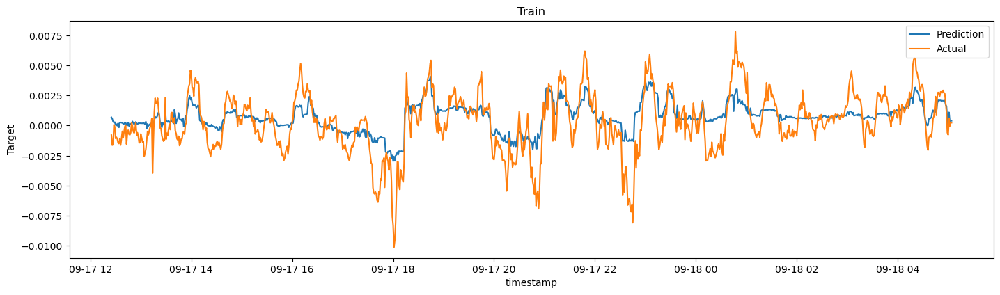

In [32]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

pred_train_series_2_small = pred_train_series_2.tail(1000)

fig, axes = plt.subplots(1, 1)
fig.tight_layout()

axes.plot(pred_train_series_2_small, label='Prediction')
axes.plot(Y_train_small, label='Actual')
axes.set_title('Train')
axes.set_xlabel('timestamp')
axes.set_ylabel('Target')
axes.legend()

plt.show()

## Grid search

In [14]:
# Grid Search (n_estimators, eta) -> Grid search (other params 1 per grid search) -> repeat

In [ ]:
# huber loss function objective = reg:pseudohubererror

In [ ]:
# log(close(t+15)/Close(t))

In [ ]:
reg = xgboost.XGBRegressor()

### eta n_estimators

In [10]:
eta_nest_params = {
    'eta': [0.001, 0.01, 0.1, 0.3],
    'n_estimators': [100, 500, 1000, 2000, 3000],
    'eval_metric': ['rmse'],
    'booster': ['gbtree']
}

In [17]:
start = time.time()
grid_search_model_1 = GridSearchCV(estimator=reg, param_grid=eta_nest_params)
grid_search_model_1.fit(X_train, Y_train)
eta_nest_tuning_time = time.time() - start

In [18]:
best_model_1 = grid_search_model_1.best_estimator_
best_params = best_model_1.get_params()
best_eta = best_params['eta']
best_nest = best_params['n_estimators']

In [19]:
print("*===eta n_estimators tuning===*")
print("Best eta: ", best_eta)
print("Best n_estimators: ", best_nest)
print("Execution time: ", datetime.timedelta(seconds=round(eta_nest_tuning_time)))

*===eta n_estimators tuning===*
Best eta:  0.1
Best n_estimators:  100
Execution time:  0:31:20


In [20]:
grid_result_1 = pd.DataFrame(grid_search_model_1.cv_results_)
grid_result_1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_booster,param_eta,param_eval_metric,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.803799,0.026969,0.008800,0.000399,gbtree,0.001,rmse,100,"{'booster': 'gbtree', 'eta': 0.001, 'eval_metr...",-27957.874853,-45626.224274,-36873.652899,-28927.233830,-35548.202178,-34986.637607,6374.901818,20
1,3.766200,0.148357,0.008801,0.000400,gbtree,0.001,rmse,500,"{'booster': 'gbtree', 'eta': 0.001, 'eval_metr...",-12551.026972,-20484.586639,-16573.489775,-13002.323989,-15970.978270,-15716.481129,2860.797503,19
2,7.452799,0.062037,0.008001,0.000001,gbtree,0.001,rmse,1000,"{'booster': 'gbtree', 'eta': 0.001, 'eval_metr...",-4609.884276,-7525.104177,-6101.770939,-4787.327644,-5875.046577,-5779.826723,1050.002671,18
3,19.049677,3.328654,0.013798,0.006241,gbtree,0.001,rmse,2000,"{'booster': 'gbtree', 'eta': 0.001, 'eval_metr...",-619.963994,-1012.778109,-829.151936,-650.734191,-795.443071,-781.614260,140.817749,16
4,25.210528,1.597144,0.010799,0.001599,gbtree,0.001,rmse,3000,"{'booster': 'gbtree', 'eta': 0.001, 'eval_metr...",-83.411088,-134.811328,-114.021205,-89.314949,-108.074827,-105.926679,18.370412,15
5,0.809999,0.018539,0.008400,0.000799,gbtree,0.01,rmse,100,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-4568.228931,-7457.145842,-6046.806863,-4744.197479,-5822.065330,-5727.688889,1040.515958,17
6,9.249595,0.153728,0.009399,0.000491,gbtree,0.01,rmse,500,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-1.064669,-2.108194,-3.385715,-1.762633,-2.434925,-2.151227,0.766539,14
7,27.631662,0.404822,0.013376,0.001357,gbtree,0.01,rmse,1000,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.261333,-0.717708,-0.603076,-0.196166,-0.486059,-0.452868,0.198185,2
8,66.488880,0.305743,0.023195,0.003660,gbtree,0.01,rmse,2000,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.351223,-1.136404,-0.799586,-0.279219,-0.670233,-0.647333,0.311796,7
9,75.195524,2.135534,0.023977,0.003412,gbtree,0.01,rmse,3000,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.351240,-1.136425,-0.800095,-0.279219,-0.670233,-0.647442,0.311849,8


In [21]:
pred_train_grid_1 = best_model_1.predict(X_train)
pred_val_grid_1 = best_model_1.predict(X_val)
pred_test_grid_1 = best_model_1.predict(X_test)

pred_train_series_grid_1 = pd.Series(pred_train_grid_1, index=Y_train.index)
pred_val_series_grid_1 = pd.Series(pred_val_grid_1, index=Y_val.index)
pred_test_series_grid_1 = pd.Series(pred_test_grid_1, index=Y_test.index)

rmse_val_grid_1 = math.sqrt(mean_squared_error(Y_val, pred_val_grid_1))
rmse_test_grid_1 = math.sqrt(mean_squared_error(Y_test, pred_test_grid_1))

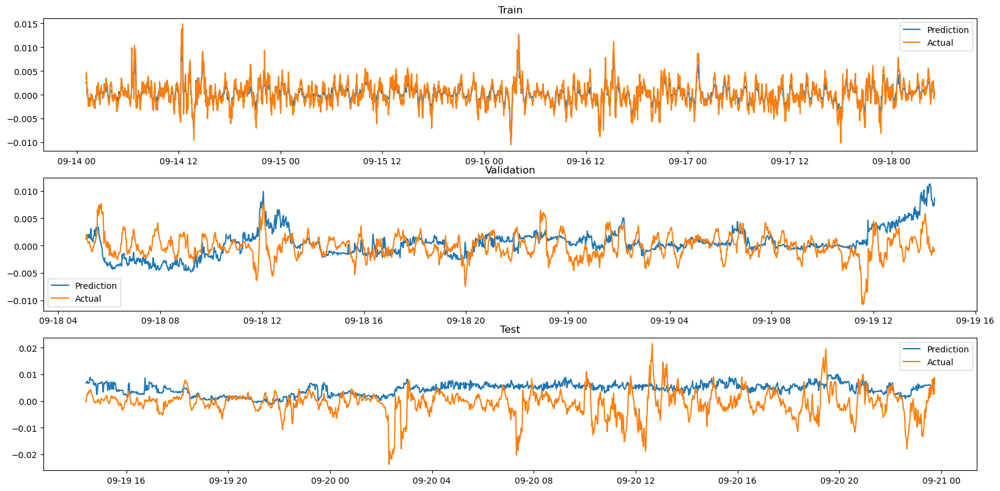

In [22]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})

fig, axes = plt.subplots(3, 1)
fig.tight_layout()

axes[0].plot(pred_train_series_grid_1, label = 'Prediction')
axes[0].plot(Y_train, label = 'Actual')
axes[0].set_title('Train')
axes[0].legend()


axes[1].plot(pred_val_series_grid_1, label = 'Prediction')
axes[1].plot(Y_val, label = 'Actual')
axes[1].set_title('Validation')
axes[1].legend()

axes[2].plot(pred_test_series_grid_1, label = 'Prediction')
axes[2].plot(Y_test, label = 'Actual')
axes[2].set_title('Test')
axes[2].legend()

In [23]:
residual_train_1 = (pred_train_grid_1 - Y_train.Target) / Y_train.Target
residual_val_1 = (pred_val_grid_1 - Y_val.Target) / Y_val.Target
residual_test_1 = (pred_test_grid_1 - Y_test.Target) / Y_test.Target

[(-5.0, 5.0)]

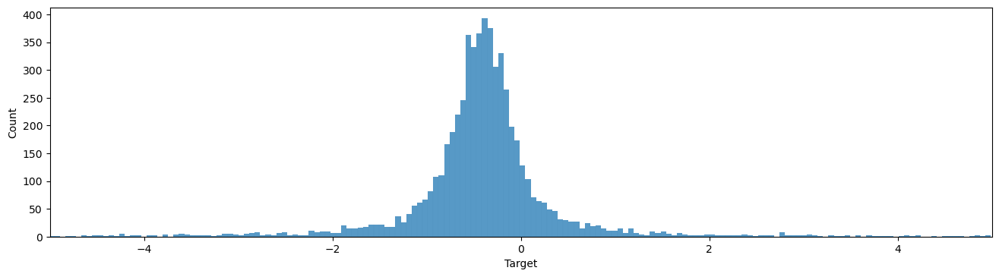

In [33]:
s1 = sns.histplot(residual_train_1)
s1.set(xlim=[-5, 5])

In [43]:
print(residual_train_1.std())
print(residual_train_1.mean())

16.772897595173287
-0.22278215867772208


[(-5.0, 5.0)]

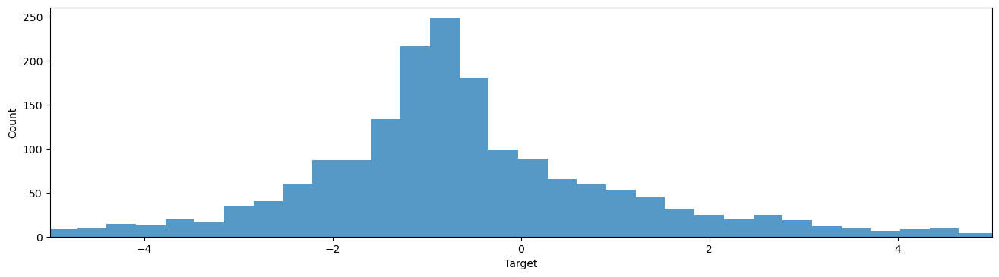

In [34]:
s2 = sns.histplot(residual_val_1)
s2.set(xlim=[-5, 5])

[(-5.0, 5.0)]

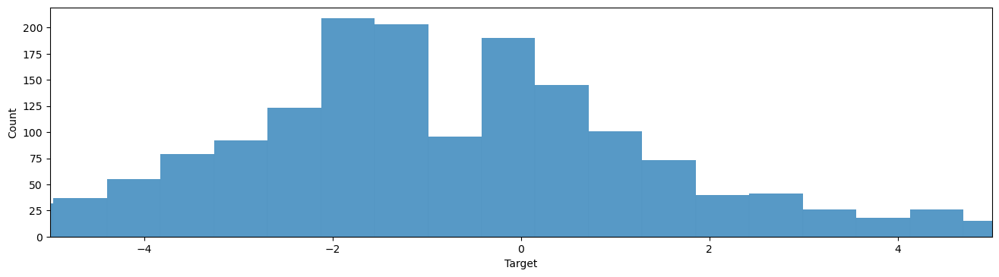

In [35]:
s3 = sns.histplot(residual_test_1)
s3.set(xlim=[-5, 5])

In [24]:
residual_train_log_1 = np.log10(residual_train_1)
y = stats.norm.pdf(residual_train_log_1)

C:\Users\Crews\anaconda3\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


C:\Users\Crews\anaconda3\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\Crews\anaconda3\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\Crews\anaconda3\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


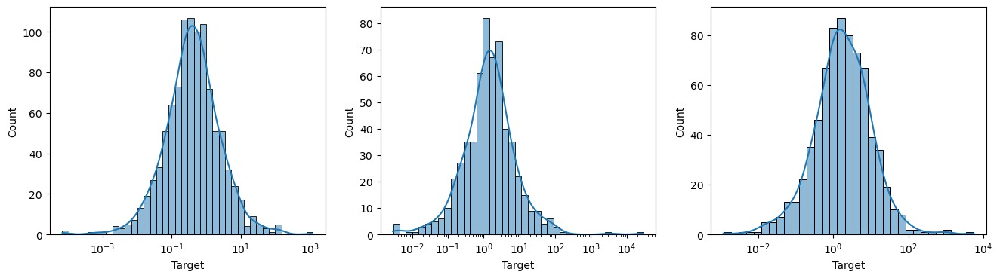

In [25]:
plt.rcParams.update({'figure.figsize':(16,4), 'figure.dpi':100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=residual_train_1, ax=axes[0], kde=True, log_scale=True)
sns.histplot(data=residual_val_1,  ax=axes[1], kde=True, log_scale=True)
sns.histplot(data=residual_test_1, ax=axes[2], kde=True, log_scale=True)

plt.show()

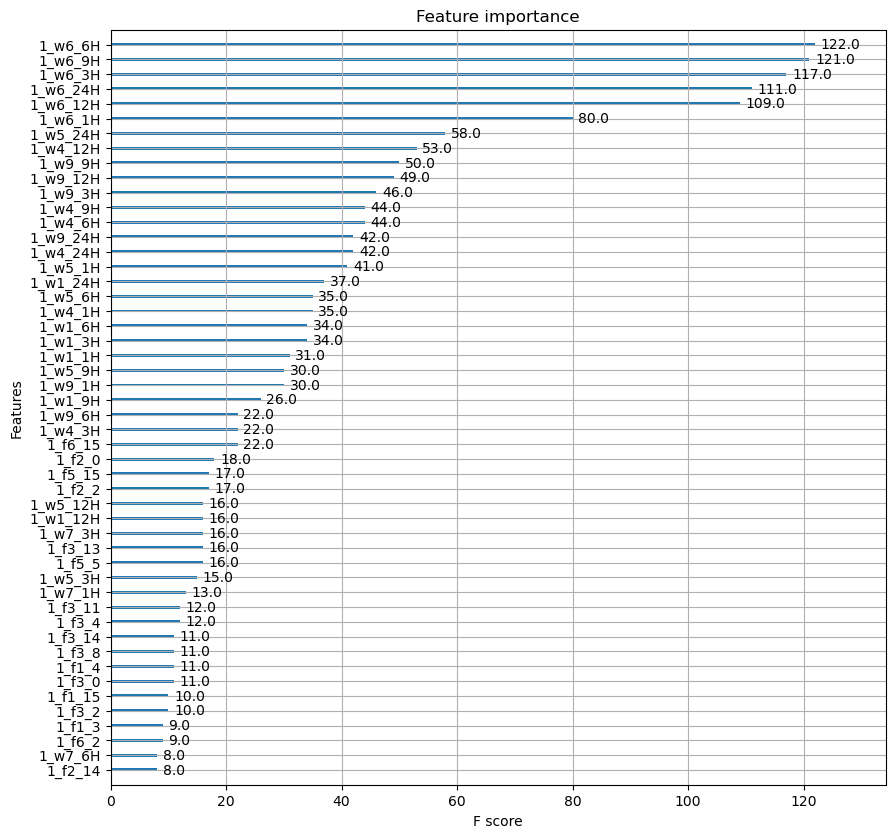

In [26]:
ax = xgboost.plot_importance(best_model_1, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

In [27]:
print("*===eta n_estimators tuning===*")
print("validation score: ", rmse_val_grid_1)
print("test score: ", rmse_test_grid_1)

*===eta n_estimators tuning===*
validation score:  0.0029942889568071976
test score:  0.007196982768525257


#### new params log target huber loss

In [11]:
eta_nest_params_new_huber = {
    'eta': [0.01, 0.03, 0.05, 0.07, 0.1, 0.3],
    'n_estimators': [100, 300, 500, 700, 900, 1000, 1100, 1300, 1500, 1700, 2000],
    'eval_metric': ['rmse'],
    'booster': ['gbtree'],
    'objective': ['reg:pseudohubererror']
}

In [12]:
start = time.time()
grid_model_log_huber_eta_nest = GridSearchCV(estimator=reg, param_grid=eta_nest_params_new_huber, scoring='neg_mean_squared_error')
grid_model_log_huber_eta_nest.fit(X_train, Y_new_train)
eta_nest_tuning_time_1 = time.time() - start

In [13]:
print("Execution time: ", datetime.timedelta(seconds=round(eta_nest_tuning_time_1)))

Execution time:  1:36:41


In [14]:
best_model_eta_nest_log_huber = grid_model_log_huber_eta_nest.best_estimator_

In [15]:
best_model_eta_nest_log_huber.save_model('models/eta_nest_log_huber.json')

In [16]:
result_1 = pd.DataFrame(grid_model_log_huber_eta_nest.cv_results_)
result_1.to_csv('old_cv_results/eta_nest_log_huber.csv')

In [10]:
result_1 = pd.read_csv('old_cv_results/eta_nest_log_huber.csv')
result_1['mean_test_score'] = -result_1.mean_test_score
result_1

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_booster,param_eta,param_eval_metric,param_n_estimators,param_objective,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0,1.129993,0.222744,0.011200,0.002482,gbtree,0.01,rmse,100,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.027360,-0.027370,-0.027532,-0.027539,-0.027471,0.027454,7.672879e-05,66
1,1,3.236000,0.152024,0.010800,0.003655,gbtree,0.01,rmse,300,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000481,-0.000472,-0.000501,-0.000500,-0.000490,0.000489,1.115166e-05,65
2,2,10.697799,0.577482,0.009601,0.001019,gbtree,0.01,rmse,500,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000013,-0.000012,-0.000022,-0.000017,-0.000017,0.000016,3.433022e-06,63
3,3,18.035121,0.481394,0.011592,0.000483,gbtree,0.01,rmse,700,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000008,-0.000006,-0.000009,-0.000008,-0.000008,0.000008,8.673000e-07,2
4,4,25.911226,0.249601,0.013175,0.001169,gbtree,0.01,rmse,900,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000009,-0.000007,-0.000009,-0.000008,-0.000008,0.000008,6.535680e-07,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,61,10.202798,0.106530,0.008401,0.000799,gbtree,0.30,rmse,1100,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000013,-0.000008,-0.000011,-0.000008,-0.000011,0.000010,1.693050e-06,56
62,62,11.621799,0.127752,0.008202,0.000399,gbtree,0.30,rmse,1300,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000013,-0.000008,-0.000011,-0.000008,-0.000011,0.000010,1.693050e-06,55
63,63,13.115800,0.157116,0.008801,0.000748,gbtree,0.30,rmse,1500,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000013,-0.000008,-0.000011,-0.000008,-0.000011,0.000010,1.693050e-06,53
64,64,14.646405,0.115631,0.007996,0.000012,gbtree,0.30,rmse,1700,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000013,-0.000008,-0.000011,-0.000008,-0.000011,0.000010,1.693050e-06,52


In [11]:
best_model_eta_nest_log_huber = xgboost.XGBRegressor()
best_model_eta_nest_log_huber.load_model('models/eta_nest_log_huber.json')

In [12]:
best_params_eta_nest_log_huber = best_model_eta_nest_log_huber.get_params()
best_eta_log_huber = best_params_eta_nest_log_huber['eta']
best_nest_log_huber = best_params_eta_nest_log_huber['n_estimators']

In [11]:
print("*===eta n_estimators log huber tuning===*")
print("Best eta: ", best_eta_log_huber)
print("Best n_estimators: ", best_nest_log_huber)

*===eta n_estimators log huber tuning===*
Best eta:  0.07
Best n_estimators:  100


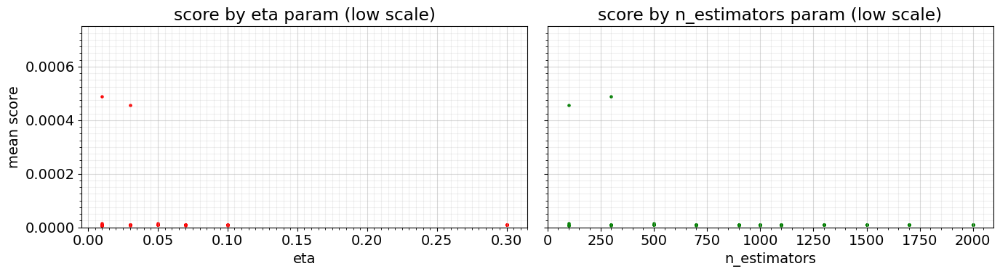

In [15]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100, 'font.size':14})

fig, axes = plt.subplots(1, 2, sharey='row')

axes[0].scatter(result_1.param_eta, result_1.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00075])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (low scale)')

axes[1].scatter(result_1.param_n_estimators, result_1.mean_test_score, c='green', s=5)
axes[1].set_xlabel('n_estimators')
axes[1].set_xticks(np.arange(0, 2100, 50), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (low scale)')

plt.tight_layout()
plt.show()

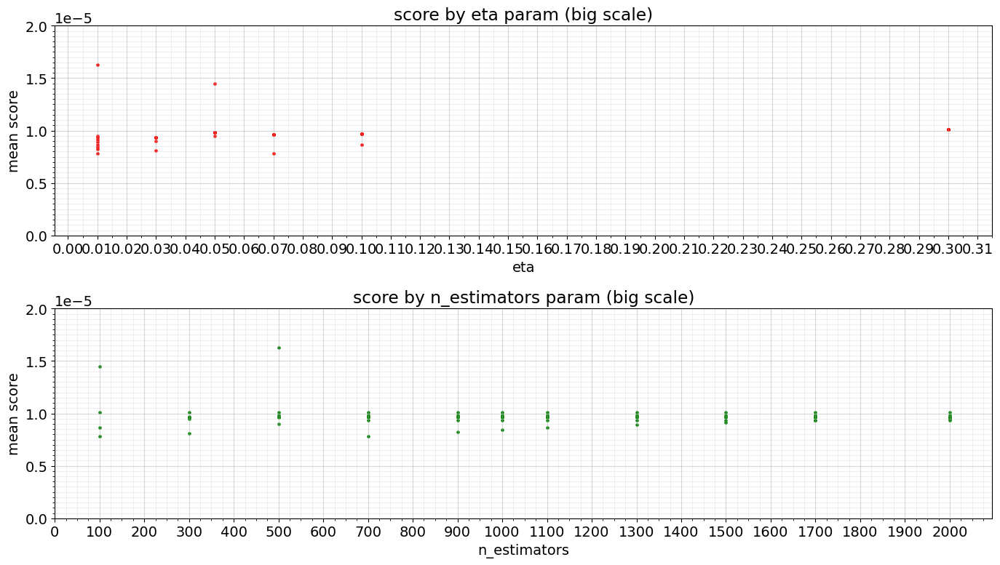

In [18]:
plt.rcParams.update({'figure.figsize':(14,8), 'figure.dpi':100, 'font.size':14})

fig, axes = plt.subplots(2, 1)

axes[0].scatter(result_1.param_eta, result_1.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00002])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.01))
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (big scale)')

axes[1].scatter(result_1.param_n_estimators, result_1.mean_test_score, c='green', s=5)
axes[1].set_ylabel('mean score')
axes[1].set_xlabel('n_estimators')
axes[1].set_ylim([0.0, 0.00002])
axes[1].set_xticks(np.arange(0, 2100, 100))
axes[1].set_xticks(np.arange(0, 2100, 25), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (big scale)')

plt.tight_layout()
plt.show()

In [13]:
pred_train_grid_eta_nest_log_huber = best_model_eta_nest_log_huber.predict(X_train)
pred_val_grid_eta_nest_log_huber = best_model_eta_nest_log_huber.predict(X_val)
pred_test_grid_eta_nest_log_huber = best_model_eta_nest_log_huber.predict(X_test)

pred_train_grid_eta_nest_log_huber_series = pd.Series(pred_train_grid_eta_nest_log_huber, index=Y_new_train.index)
pred_val_grid_eta_nest_log_huber_series = pd.Series(pred_val_grid_eta_nest_log_huber, index=Y_new_val.index)
pred_test_grid_eta_nest_log_huber_series = pd.Series(pred_test_grid_eta_nest_log_huber, index=Y_new_test.index)

rmse_train_grid_eta_nest_log_huber = math.sqrt(mean_squared_error(Y_new_train, pred_train_grid_eta_nest_log_huber))
rmse_val_grid_eta_nest_log_huber = math.sqrt(mean_squared_error(Y_new_val, pred_val_grid_eta_nest_log_huber))
rmse_test_grid_eta_nest_log_huber = math.sqrt(mean_squared_error(Y_new_test, pred_test_grid_eta_nest_log_huber))

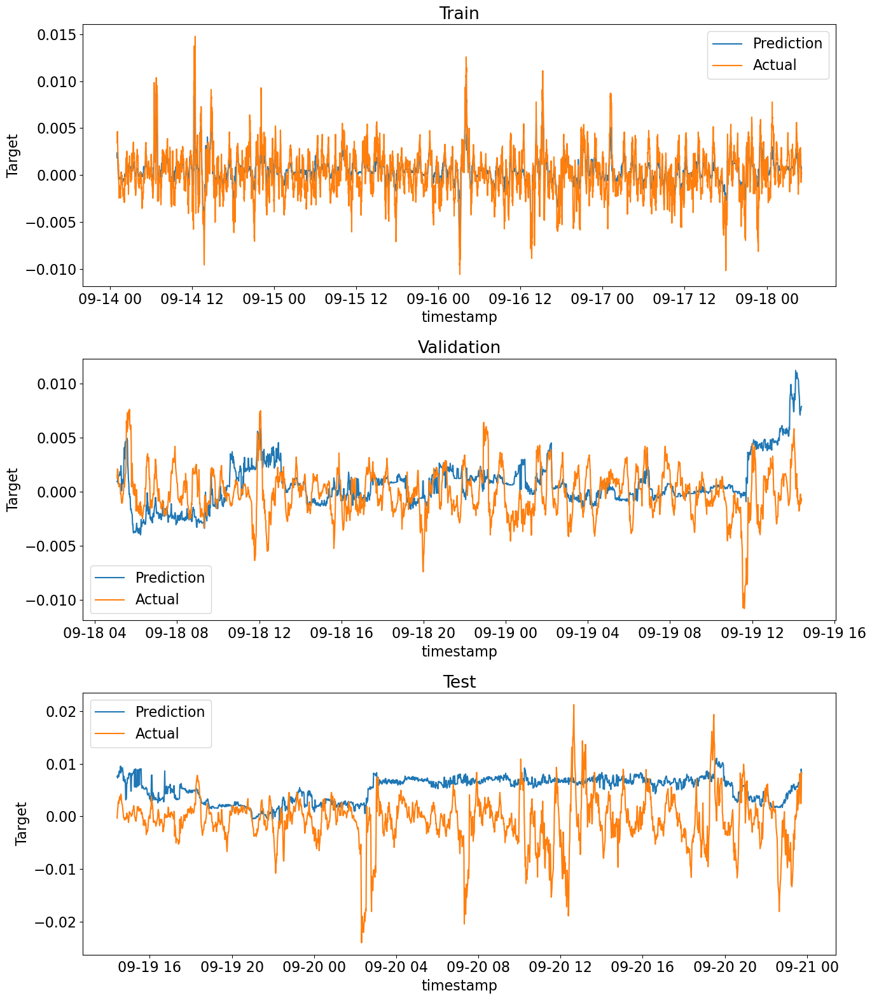

In [23]:
plt.rcParams.update({'figure.figsize':(14,16), 'figure.dpi':100, 'font.size':16})

fig, axes = plt.subplots(3, 1)

axes[0].plot(pred_train_grid_eta_nest_log_huber_series, label = 'Prediction')
axes[0].plot(Y_new_train, label = 'Actual')
axes[0].set_title('Train')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('Target')
axes[0].legend()

axes[1].plot(pred_val_grid_eta_nest_log_huber_series, label = 'Prediction')
axes[1].plot(Y_new_val, label = 'Actual')
axes[1].set_title('Validation')
axes[1].set_ylabel('Target')
axes[1].set_xlabel('timestamp')
axes[1].legend()

axes[2].plot(pred_test_grid_eta_nest_log_huber_series, label = 'Prediction')
axes[2].plot(Y_new_test, label = 'Actual')
axes[2].set_title('Test')
axes[2].set_ylabel('Target')
axes[2].set_xlabel('timestamp')
axes[2].legend()

fig.tight_layout()
plt.show()

NameError: name 'Y_new_train_small' is not defined

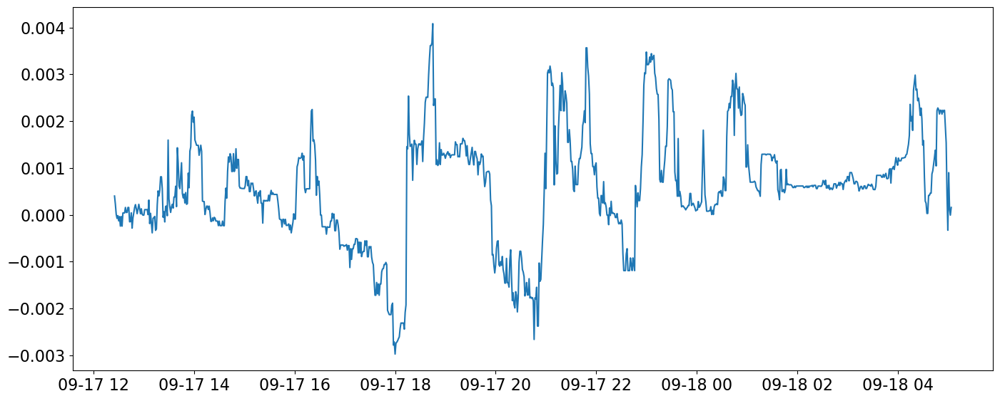

In [24]:
plt.rcParams.update({'figure.figsize':(14,6), 'figure.dpi':100, 'font.size': 16})

pred_train_grid_eta_nest_log_huber_series_small = pred_train_grid_eta_nest_log_huber_series.tail(1000)

fig, axes = plt.subplots(1, 1)
fig.tight_layout()

axes.plot(pred_train_grid_eta_nest_log_huber_series_small, label='Prediction')
axes.plot(Y_new_train_small, label='Actual')
axes.set_title('Train')
axes.set_xlabel('timestamp')
axes.set_ylabel('Target')
axes.legend()

plt.show()

In [25]:
residual_train_grid_eta_nest_log_huber = (pred_train_grid_eta_nest_log_huber - Y_new_train.Target_new) / Y_new_train.Target_new
residual_val_grid_eta_nest_log_huber = (pred_val_grid_eta_nest_log_huber - Y_new_val.Target_new) / Y_new_val.Target_new
residual_test_grid_eta_nest_log_huber = (pred_test_grid_eta_nest_log_huber - Y_new_test.Target_new) / Y_new_test.Target_new

print('Residual train std: ', residual_train_grid_eta_nest_log_huber.std())
print('Residual validation std: ', residual_val_grid_eta_nest_log_huber.std())
print('Residual test std: ', residual_test_grid_eta_nest_log_huber.std())

Residual train std:  14.526081897253878
Residual validation std:  528.6058675885712
Residual test std:  125.45858175995502


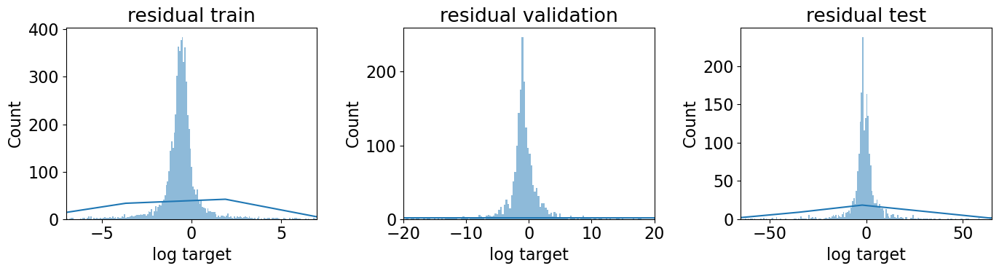

In [50]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=residual_train_grid_eta_nest_log_huber, ax=axes[0], kde=True)
sns.histplot(data=residual_val_grid_eta_nest_log_huber,  ax=axes[1], kde=True)
sns.histplot(data=residual_test_grid_eta_nest_log_huber, ax=axes[2], kde=True)

axes[0].set_xlim([-7, 7])
axes[0].set_xlabel('log target')
axes[0].set_title('residual train')
axes[1].set_xlim([-20, 20])
axes[1].set_xlabel('log target')
axes[1].set_title('residual validation')
axes[2].set_xlim([-65, 65])
axes[2].set_xlabel('log target')
axes[2].set_title('residual test')

plt.tight_layout()
plt.show()

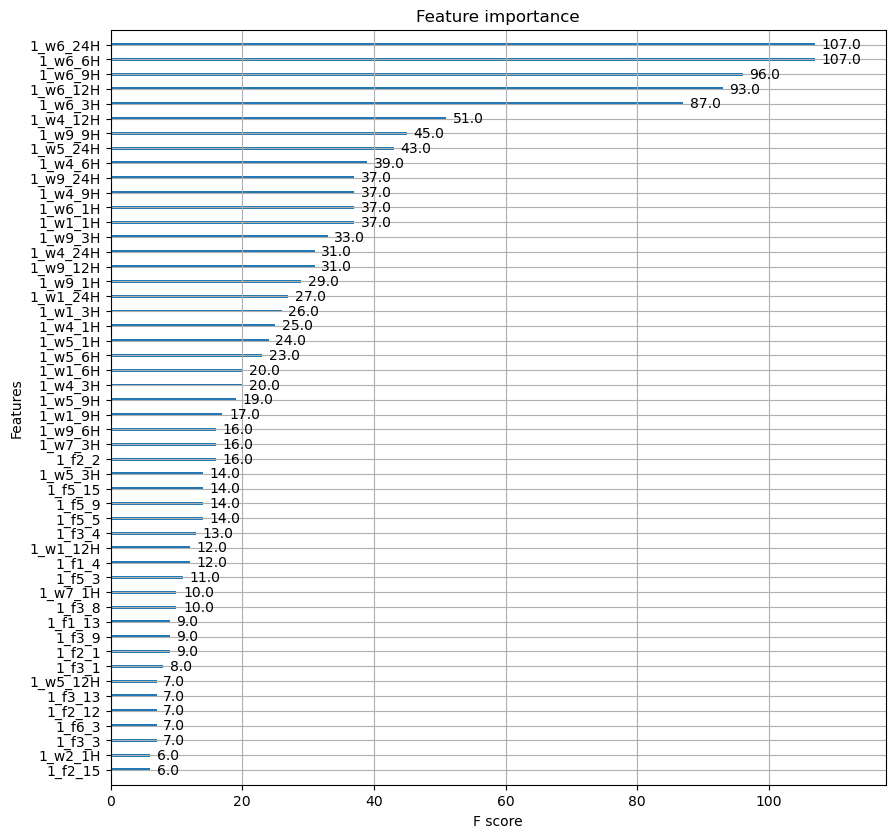

In [20]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100, 'font.size': 10})

ax = xgboost.plot_importance(best_model_eta_nest_log_huber, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

#### new params old target huber loss

In [18]:
start = time.time()
grid_model_huber_eta_nest = GridSearchCV(estimator=reg, param_grid=eta_nest_params_new_huber, scoring='neg_mean_squared_error')
grid_model_huber_eta_nest.fit(X_train, Y_train)
eta_nest_tuning_time_2 = time.time() - start

In [33]:
best_model_eta_nest_huber = grid_model_huber_eta_nest.best_estimator_

In [34]:
best_model_eta_nest_huber.save_model('models/eta_nest_huber.json')

In [26]:
best_model_eta_nest_huber = xgboost.XGBRegressor()
best_model_eta_nest_huber.load_model('models/eta_nest_huber.json')

In [27]:
best_params_eta_nest_huber = best_model_eta_nest_huber.get_params()
best_eta_huber = best_params_eta_nest_huber['eta']
best_nest_huber = best_params_eta_nest_huber['n_estimators']

In [29]:
print("*===eta n_estimators huber tuning===*")
print("Best eta: ", best_eta_huber)
print("Best n_estimators: ", best_nest_huber)

*===eta n_estimators huber tuning===*
Best eta:  0.07
Best n_estimators:  100


In [36]:
result_2 = pd.DataFrame(grid_model_huber_eta_nest.cv_results_)
result_2['mean_test_score'] = -result_2.mean_test_score
result_2

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_booster,param_eta,param_eval_metric,param_n_estimators,param_objective,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.260200,0.552644,0.013200,0.007546,gbtree,0.01,rmse,100,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.027360,-0.027370,-0.027532,-0.027538,-0.027471,0.027454,7.670189e-05,66
1,3.382198,0.740382,0.009802,0.002134,gbtree,0.01,rmse,300,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000482,-0.000472,-0.000501,-0.000500,-0.000490,0.000489,1.111425e-05,65
2,16.348604,2.089642,0.013802,0.003969,gbtree,0.01,rmse,500,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000013,-0.000012,-0.000022,-0.000017,-0.000017,0.000016,3.422924e-06,63
3,23.193817,1.826697,0.043399,0.041993,gbtree,0.01,rmse,700,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000008,-0.000006,-0.000009,-0.000008,-0.000008,0.000008,8.597539e-07,2
4,26.322271,0.594957,0.012785,0.001174,gbtree,0.01,rmse,900,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000009,-0.000007,-0.000009,-0.000008,-0.000008,0.000008,6.692968e-07,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,9.856000,0.251464,0.008401,0.000490,gbtree,0.3,rmse,1100,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000009,-0.000012,-0.000011,-0.000013,0.000011,1.167955e-06,56
62,11.265799,0.291899,0.008801,0.000749,gbtree,0.3,rmse,1300,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000009,-0.000012,-0.000011,-0.000013,0.000011,1.167955e-06,54
63,12.817399,0.355277,0.009001,0.000632,gbtree,0.3,rmse,1500,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000009,-0.000012,-0.000011,-0.000013,0.000011,1.167955e-06,53
64,14.325007,0.114721,0.008993,0.000016,gbtree,0.3,rmse,1700,reg:pseudohubererror,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000009,-0.000012,-0.000011,-0.000013,0.000011,1.167955e-06,52


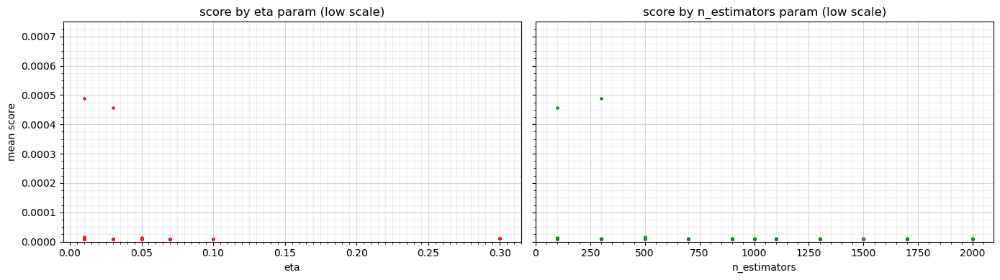

In [37]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100})

fig, axes = plt.subplots(1, 2, sharey='row')

axes[0].scatter(result_2.param_eta, result_2.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00075])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (low scale)')

axes[1].scatter(result_2.param_n_estimators, result_2.mean_test_score, c='green', s=5)
axes[1].set_xlabel('n_estimators')
axes[1].set_xticks(np.arange(0, 2100, 50), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (low scale)')

plt.tight_layout()
plt.show()

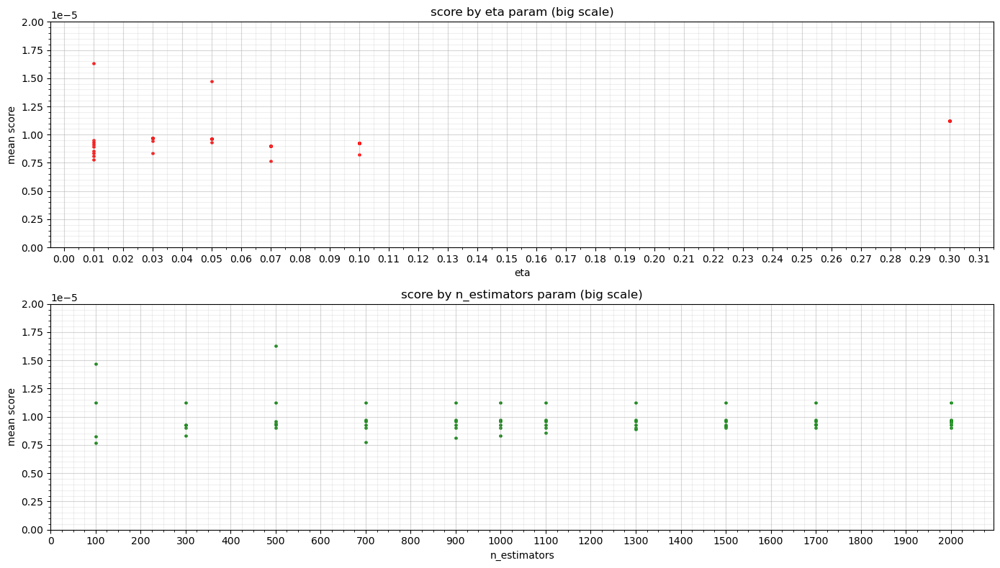

In [38]:
plt.rcParams.update({'figure.figsize':(14,8), 'figure.dpi':100})

fig, axes = plt.subplots(2, 1)

axes[0].scatter(result_2.param_eta, result_2.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00002])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.01))
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (big scale)')

axes[1].scatter(result_2.param_n_estimators, result_2.mean_test_score, c='green', s=5)
axes[1].set_ylabel('mean score')
axes[1].set_xlabel('n_estimators')
axes[1].set_ylim([0.0, 0.00002])
axes[1].set_xticks(np.arange(0, 2100, 100))
axes[1].set_xticks(np.arange(0, 2100, 25), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (big scale)')

plt.tight_layout()
plt.show()

In [30]:
pred_train_grid_eta_nest_huber = best_model_eta_nest_huber.predict(X_train)
pred_val_grid_eta_nest_huber = best_model_eta_nest_huber.predict(X_val)
pred_test_grid_eta_nest_huber = best_model_eta_nest_huber.predict(X_test)

pred_train_grid_eta_nest_huber_series = pd.Series(pred_train_grid_eta_nest_huber, index=Y_train.index)
pred_val_grid_eta_nest_huber_series = pd.Series(pred_val_grid_eta_nest_huber, index=Y_val.index)
pred_test_grid_eta_nest_huber_series = pd.Series(pred_test_grid_eta_nest_huber, index=Y_test.index)

rmse_train_grid_eta_nest_huber = math.sqrt(mean_squared_error(Y_train, pred_train_grid_eta_nest_huber))
rmse_val_grid_eta_nest_huber = math.sqrt(mean_squared_error(Y_val, pred_val_grid_eta_nest_huber))
rmse_test_grid_eta_nest_huber = math.sqrt(mean_squared_error(Y_test, pred_test_grid_eta_nest_huber))

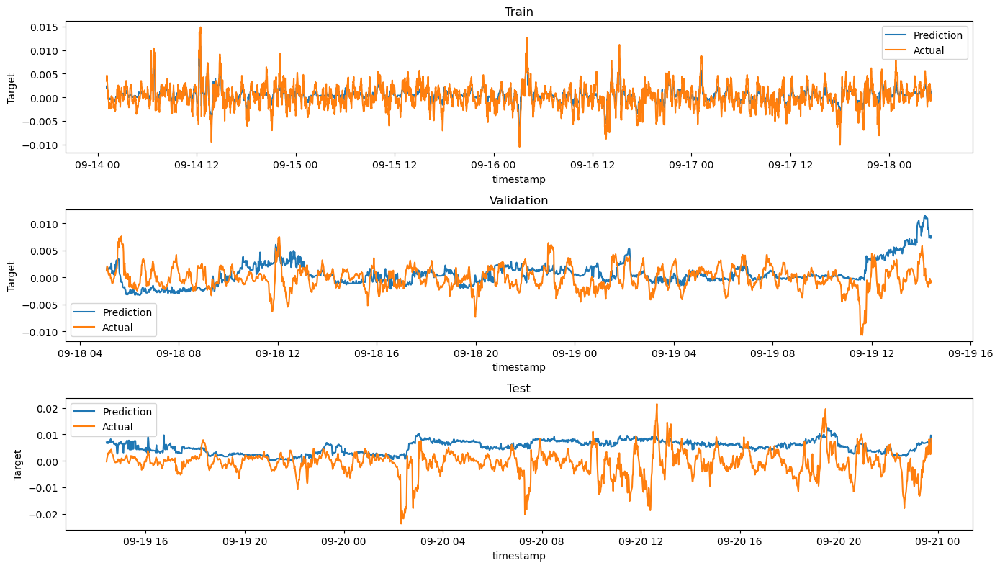

In [40]:
plt.rcParams.update({'figure.figsize':(14,8), 'figure.dpi':100})

fig, axes = plt.subplots(3, 1)


axes[0].plot(pred_train_grid_eta_nest_huber_series, label = 'Prediction')
axes[0].plot(Y_train, label = 'Actual')
axes[0].set_title('Train')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('Target')
axes[0].legend()


axes[1].plot(pred_val_grid_eta_nest_huber_series, label = 'Prediction')
axes[1].plot(Y_val, label = 'Actual')
axes[1].set_title('Validation')
axes[1].set_ylabel('Target')
axes[1].set_xlabel('timestamp')
axes[1].legend()

axes[2].plot(pred_test_grid_eta_nest_huber_series, label = 'Prediction')
axes[2].plot(Y_test, label = 'Actual')
axes[2].set_title('Test')
axes[2].set_ylabel('Target')
axes[2].set_xlabel('timestamp')
axes[2].legend()

fig.tight_layout()
plt.show()

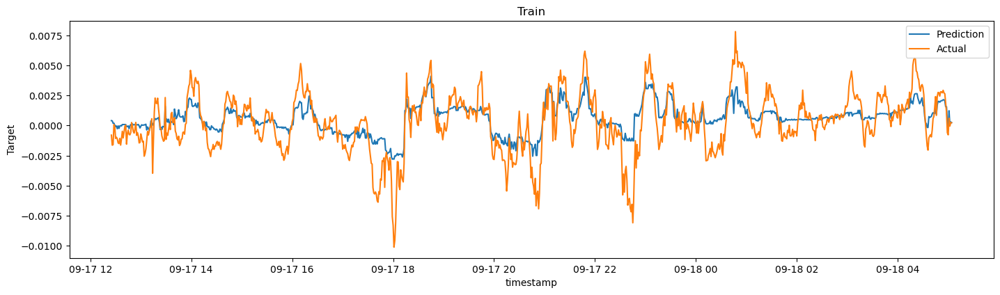

In [41]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100})

pred_train_grid_eta_nest_huber_series_small = pred_train_grid_eta_nest_huber_series.tail(1000)

fig, axes = plt.subplots(1, 1)
fig.tight_layout()

axes.plot(pred_train_grid_eta_nest_huber_series_small, label='Prediction')
axes.plot(Y_train_small, label='Actual')
axes.set_title('Train')
axes.set_xlabel('timestamp')
axes.set_ylabel('Target')
axes.legend()

plt.show()

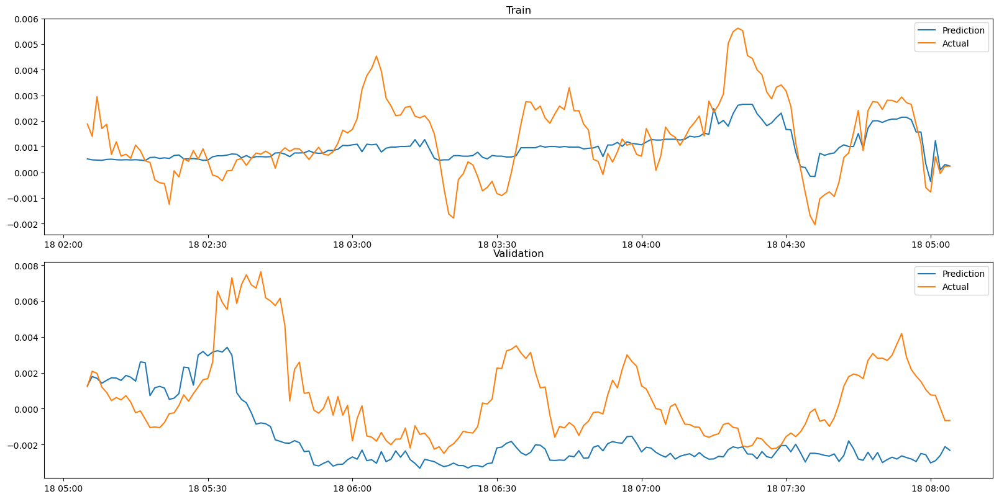

In [46]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})

fig, axes = plt.subplots(2, 1)
fig.tight_layout()

axes[0].plot(pred_train_grid_eta_nest_huber_series.tail(180), label = 'Prediction')
axes[0].plot(Y_train.tail(180), label = 'Actual')
axes[0].set_title('Train')
axes[0].legend()


axes[1].plot(pred_val_grid_eta_nest_huber_series.head(180), label = 'Prediction')
axes[1].plot(Y_val.head(180), label = 'Actual')
axes[1].set_title('Validation')
axes[1].legend()

In [42]:
residual_train_grid_eta_nest_huber = (pred_train_grid_eta_nest_huber - Y_train.Target) / Y_train.Target
residual_val_grid_eta_nest_huber = (pred_val_grid_eta_nest_huber - Y_val.Target) / Y_val.Target
residual_test_grid_eta_nest_huber = (pred_test_grid_eta_nest_huber - Y_test.Target) / Y_test.Target

print('Residual train std: ', residual_train_grid_eta_nest_huber.std())
print('Residual validation std: ', residual_val_grid_eta_nest_huber.std())
print('Residual test std: ', residual_test_grid_eta_nest_huber.std())

Residual train std:  14.046560946131239
Residual validation std:  104.00193652591565
Residual test std:  159.5832353918554


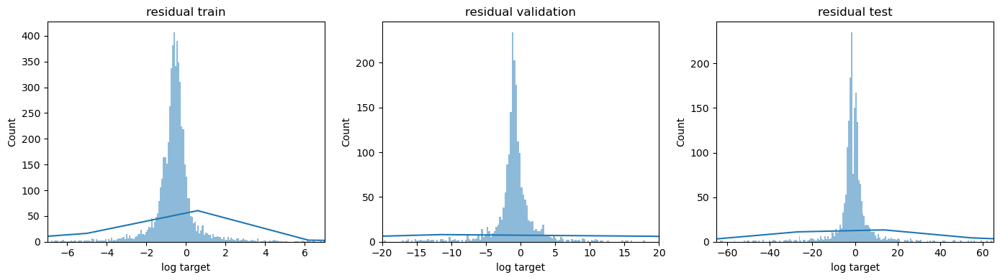

In [43]:
plt.rcParams.update({'figure.figsize':(14,4), 'figure.dpi':100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=residual_train_grid_eta_nest_huber, ax=axes[0], kde=True)
sns.histplot(data=residual_val_grid_eta_nest_huber,  ax=axes[1], kde=True)
sns.histplot(data=residual_test_grid_eta_nest_huber, ax=axes[2], kde=True)

axes[0].set_xlim([-7, 7])
axes[0].set_xlabel('log target')
axes[0].set_title('residual train')
axes[1].set_xlim([-20, 20])
axes[1].set_xlabel('log target')
axes[1].set_title('residual validation')
axes[2].set_xlim([-65, 65])
axes[2].set_xlabel('log target')
axes[2].set_title('residual test')

plt.tight_layout()
plt.show()

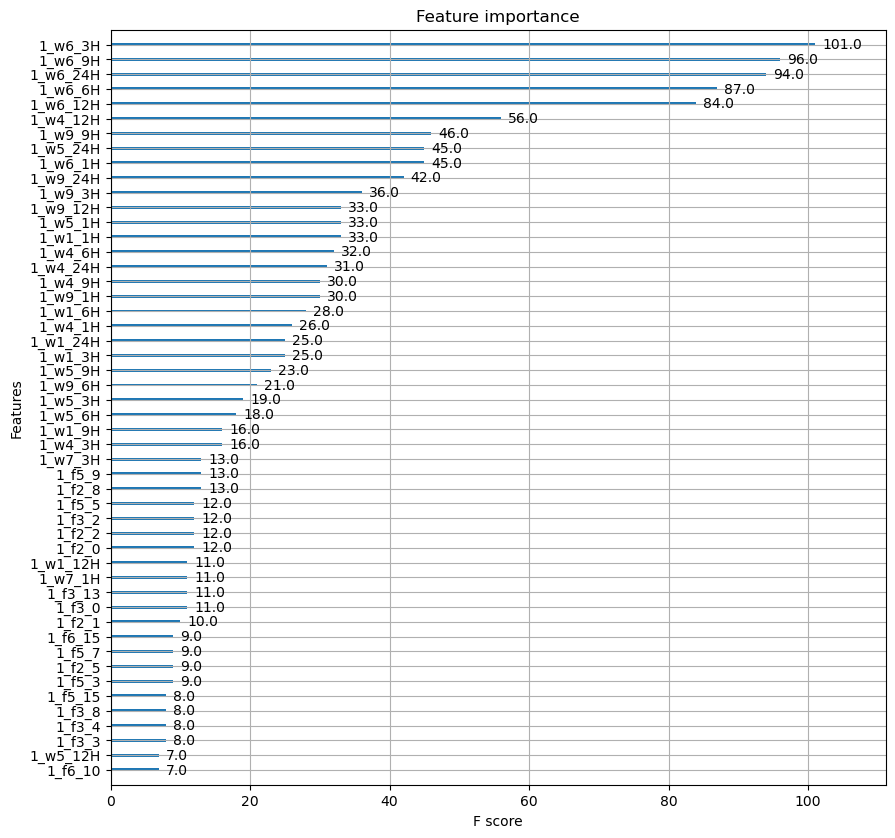

In [44]:
ax = xgboost.plot_importance(best_model_eta_nest_huber, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

#### new params log target squared loss

In [21]:
eta_nest_params_new_squared = {
    'eta': [0.01, 0.03, 0.05, 0.07, 0.1, 0.3],
    'n_estimators': [100, 300, 500, 700, 900, 1000, 1100, 1300, 1500, 1700, 2000],
    'eval_metric': ['rmse'],
    'booster': ['gbtree']
}

In [22]:
start = time.time()
grid_model_log_squared_eta_nest = GridSearchCV(estimator=reg, param_grid=eta_nest_params_new_squared, scoring='neg_mean_squared_error')
grid_model_log_squared_eta_nest.fit(X_train, Y_new_train)
eta_nest_tuning_time_3 = time.time() - start

In [23]:
best_model_eta_nest_log_squared = grid_model_log_squared_eta_nest.best_estimator_

In [24]:
best_model_eta_nest_log_squared.save_model('models/eta_nest_log_quadratic.json')

In [31]:
best_model_eta_nest_log_squared = xgboost.XGBRegressor()
best_model_eta_nest_log_squared.load_model('models/eta_nest_log_quadratic.json')

In [33]:
best_params_eta_nest_log_squared = best_model_eta_nest_log_squared.get_params()
best_eta_log_squared = best_params_eta_nest_log_squared['eta']
best_nest_log_squared = best_params_eta_nest_log_squared['n_estimators']

In [34]:
print("*===eta n_estimators log squared tuning===*")
print("Best eta: ", best_eta_log_squared)
print("Best n_estimators: ", best_nest_log_squared)

*===eta n_estimators log squared tuning===*
Best eta:  0.01
Best n_estimators:  700


In [52]:
result_3 = pd.DataFrame(grid_model_log_squared_eta_nest.cv_results_)
result_3['mean_test_score'] = -result_3.mean_test_score
result_3

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_booster,param_eta,param_eval_metric,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.742999,0.049804,0.009200,0.000400,gbtree,0.01,rmse,100,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.033391,-0.033401,-0.033577,-0.033584,-0.033511,0.033493,8.303055e-05,66
1,2.460000,0.115730,0.009001,0.000001,gbtree,0.01,rmse,300,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000601,-0.000592,-0.000622,-0.000623,-0.000611,0.000610,1.202871e-05,65
2,9.220103,0.200374,0.008802,0.000400,gbtree,0.01,rmse,500,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000015,-0.000014,-0.000025,-0.000019,-0.000019,0.000018,3.886299e-06,63
3,16.222819,0.290410,0.010181,0.000396,gbtree,0.01,rmse,700,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000008,-0.000006,-0.000009,-0.000008,-0.000008,0.000008,9.838940e-07,1
4,23.432619,0.241774,0.012980,0.001281,gbtree,0.01,rmse,900,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000009,-0.000007,-0.000009,-0.000008,-0.000008,0.000008,7.060475e-07,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,9.812001,0.129884,0.008400,0.000491,gbtree,0.3,rmse,1100,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000010,-0.000011,-0.000009,-0.000012,0.000010,1.052650e-06,56
62,11.197398,0.138850,0.008401,0.000490,gbtree,0.3,rmse,1300,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000010,-0.000011,-0.000009,-0.000012,0.000010,1.052650e-06,57
63,12.768399,0.287556,0.008399,0.000491,gbtree,0.3,rmse,1500,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000010,-0.000011,-0.000009,-0.000012,0.000010,1.052650e-06,58
64,14.125225,0.221550,0.009176,0.000767,gbtree,0.3,rmse,1700,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000011,-0.000010,-0.000011,-0.000009,-0.000012,0.000010,1.052650e-06,59


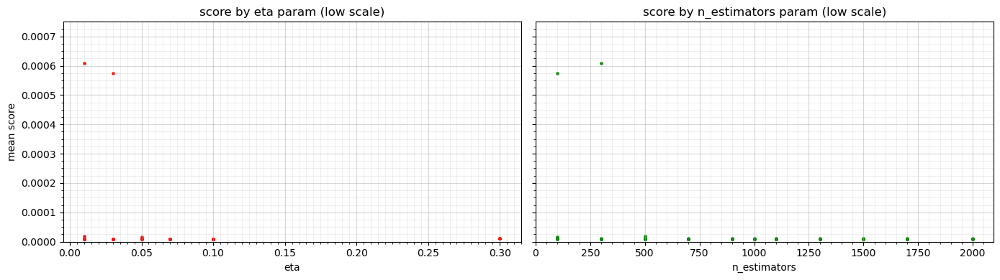

In [53]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

fig, axes = plt.subplots(1, 2, sharey='row')

axes[0].scatter(result_3.param_eta, result_3.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00075])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (low scale)')

axes[1].scatter(result_3.param_n_estimators, result_3.mean_test_score, c='green', s=5)
axes[1].set_xlabel('n_estimators')
axes[1].set_xticks(np.arange(0, 2100, 50), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (low scale)')

plt.tight_layout()
plt.show()

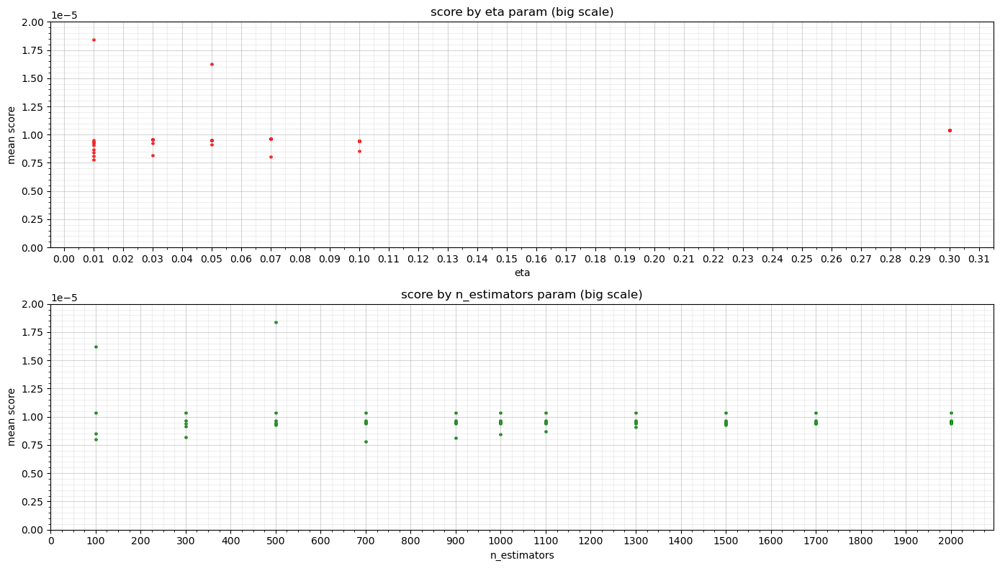

In [55]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 1)

axes[0].scatter(result_3.param_eta, result_3.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00002])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.01))
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (big scale)')

axes[1].scatter(result_3.param_n_estimators, result_3.mean_test_score, c='green', s=5)
axes[1].set_ylabel('mean score')
axes[1].set_xlabel('n_estimators')
axes[1].set_ylim([0.0, 0.00002])
axes[1].set_xticks(np.arange(0, 2100, 100))
axes[1].set_xticks(np.arange(0, 2100, 25), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (big scale)')

plt.tight_layout()
plt.show()

In [35]:
pred_train_grid_eta_nest_log_squared = best_model_eta_nest_log_squared.predict(X_train)
pred_val_grid_eta_nest_log_squared = best_model_eta_nest_log_squared.predict(X_val)
pred_test_grid_eta_nest_log_squared = best_model_eta_nest_log_squared.predict(X_test)

pred_train_grid_eta_nest_log_squared_series = pd.Series(pred_train_grid_eta_nest_log_squared, index=Y_new_train.index)
pred_val_grid_eta_nest_log_squared_series = pd.Series(pred_val_grid_eta_nest_log_squared, index=Y_new_val.index)
pred_test_grid_eta_nest_log_squared_series = pd.Series(pred_test_grid_eta_nest_log_squared, index=Y_new_test.index)

rmse_train_grid_eta_nest_log_squared = math.sqrt(mean_squared_error(Y_new_train, pred_train_grid_eta_nest_log_squared))
rmse_val_grid_eta_nest_log_squared = math.sqrt(mean_squared_error(Y_new_val, pred_val_grid_eta_nest_log_squared))
rmse_test_grid_eta_nest_log_squared = math.sqrt(mean_squared_error(Y_new_test, pred_test_grid_eta_nest_log_squared))

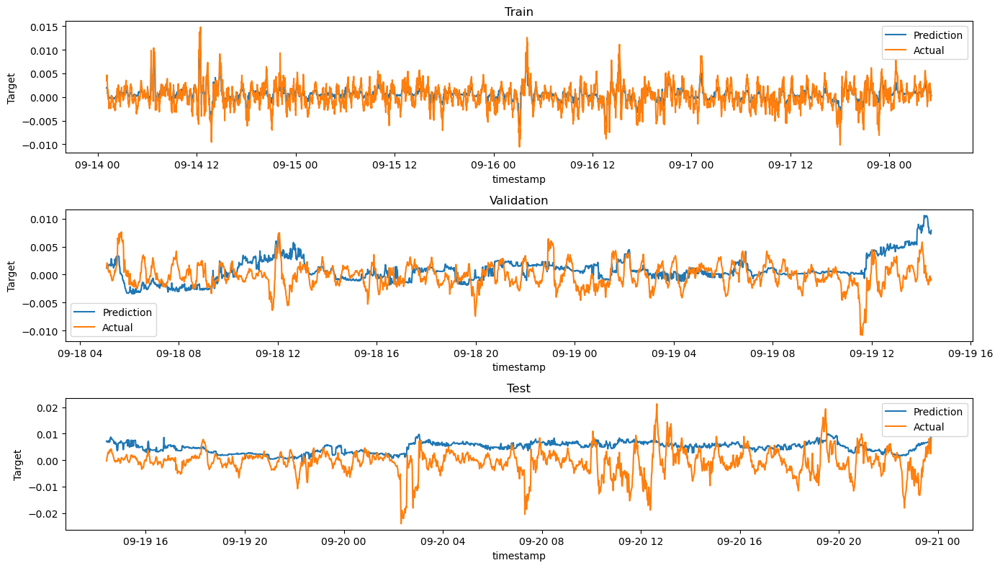

In [57]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(3, 1)

axes[0].plot(pred_train_grid_eta_nest_log_squared_series, label='Prediction')
axes[0].plot(Y_new_train, label='Actual')
axes[0].set_title('Train')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('Target')
axes[0].legend()

axes[1].plot(pred_val_grid_eta_nest_log_squared_series, label='Prediction')
axes[1].plot(Y_new_val, label='Actual')
axes[1].set_title('Validation')
axes[1].set_ylabel('Target')
axes[1].set_xlabel('timestamp')
axes[1].legend()

axes[2].plot(pred_test_grid_eta_nest_log_squared_series, label='Prediction')
axes[2].plot(Y_new_test, label='Actual')
axes[2].set_title('Test')
axes[2].set_ylabel('Target')
axes[2].set_xlabel('timestamp')
axes[2].legend()

fig.tight_layout()
plt.show()

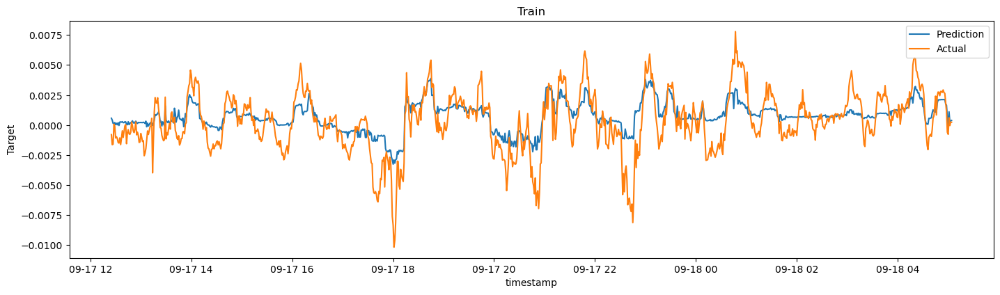

In [58]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

pred_train_grid_eta_nest_log_squared_series_small = pred_train_grid_eta_nest_log_squared_series.tail(1000)

fig, axes = plt.subplots(1, 1)
fig.tight_layout()

axes.plot(pred_train_grid_eta_nest_log_squared_series_small, label='Prediction')
axes.plot(Y_new_train_small, label='Actual')
axes.set_title('Train')
axes.set_xlabel('timestamp')
axes.set_ylabel('Target')
axes.legend()

plt.show()

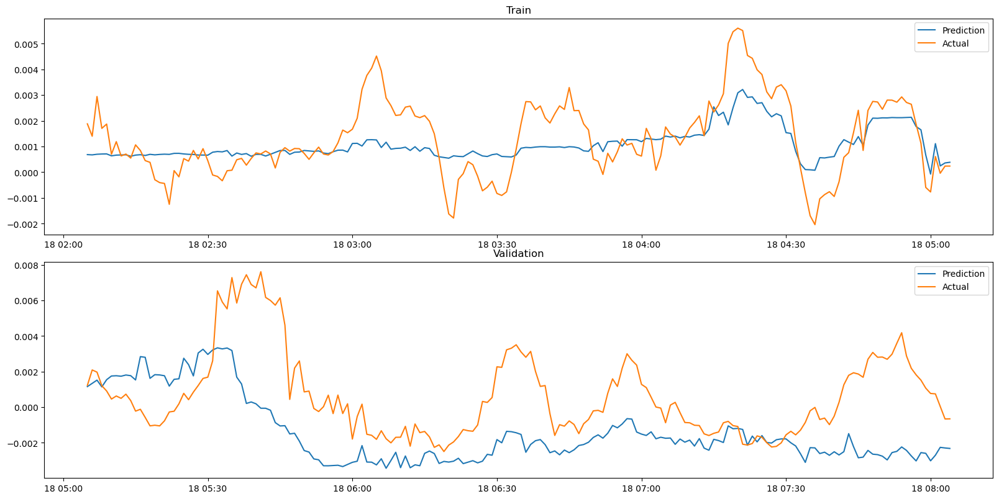

In [59]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})

fig, axes = plt.subplots(2, 1)
fig.tight_layout()

axes[0].plot(pred_train_grid_eta_nest_log_squared_series.tail(180), label = 'Prediction')
axes[0].plot(Y_new_train.tail(180), label = 'Actual')
axes[0].set_title('Train')
axes[0].legend()


axes[1].plot(pred_val_grid_eta_nest_log_squared_series.head(180), label = 'Prediction')
axes[1].plot(Y_new_val.head(180), label = 'Actual')
axes[1].set_title('Validation')
axes[1].legend()

In [71]:
residual_train_grid_eta_nest_log_squared = (pred_train_grid_eta_nest_log_squared - Y_new_train.Target_new) / Y_new_train.Target_new
residual_val_grid_eta_nest_log_squared = (pred_val_grid_eta_nest_log_squared - Y_new_val.Target_new) / Y_new_val.Target_new
residual_test_grid_eta_nest_log_squared = (pred_test_grid_eta_nest_log_squared - Y_new_test.Target_new) / Y_new_test.Target_new

print('Residual train std: ', residual_train_grid_eta_nest_log_squared.std())
print('Residual validation std: ', residual_val_grid_eta_nest_log_squared.std())
print('Residual test std: ', residual_test_grid_eta_nest_log_squared.std())

Residual train std:  14.289025811260206
Residual validation std:  672.4839698583858
Residual test std:  139.7475824314964


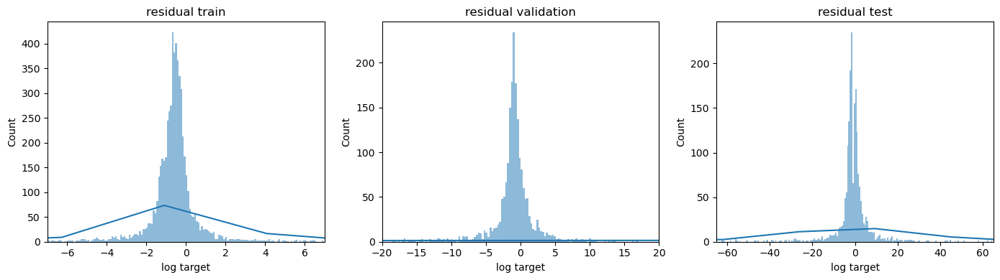

In [72]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=residual_train_grid_eta_nest_log_squared, ax=axes[0], kde=True)
sns.histplot(data=residual_val_grid_eta_nest_log_squared, ax=axes[1], kde=True)
sns.histplot(data=residual_test_grid_eta_nest_log_squared, ax=axes[2], kde=True)

axes[0].set_xlim([-7, 7])
axes[0].set_xlabel('log target')
axes[0].set_title('residual train')
axes[1].set_xlim([-20, 20])
axes[1].set_xlabel('log target')
axes[1].set_title('residual validation')
axes[2].set_xlim([-65, 65])
axes[2].set_xlabel('log target')
axes[2].set_title('residual test')

plt.tight_layout()
plt.show()

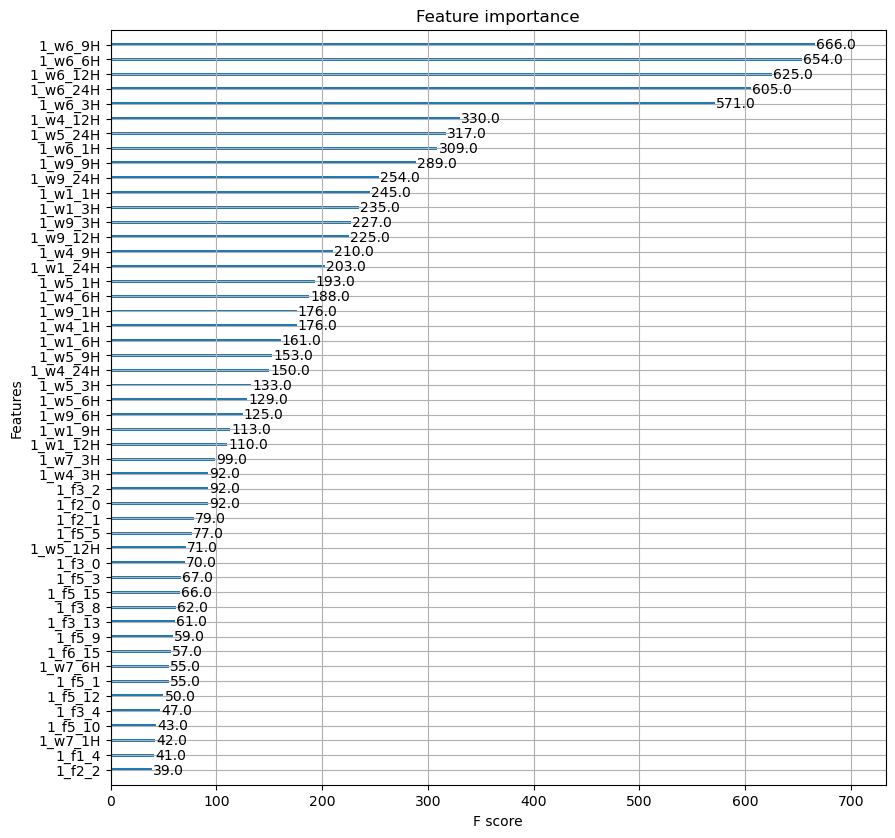

In [73]:
ax = xgboost.plot_importance(best_model_eta_nest_log_squared, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

#### new params old target squared loss

In [25]:
start = time.time()
grid_model_squared_eta_nest = GridSearchCV(estimator=reg, param_grid=eta_nest_params_new_squared, scoring='neg_mean_squared_error')
grid_model_squared_eta_nest.fit(X_train, Y_train)
eta_nest_tuning_time_4 = time.time() - start

In [26]:
best_model_eta_nest_squared = grid_model_squared_eta_nest.best_estimator_

In [27]:
best_model_eta_nest_squared.save_model('models/eta_nest_quadartic.json')

In [36]:
best_model_eta_nest_squared = xgboost.XGBRegressor()
best_model_eta_nest_squared.load_model('models/eta_nest_quadartic.json')

In [37]:
best_params_eta_nest_squared = best_model_eta_nest_squared.get_params()
best_eta_squared = best_params_eta_nest_squared['eta']
best_nest_squared = best_params_eta_nest_squared['n_estimators']

In [60]:
print("*===eta n_estimators huber tuning===*")
print("Best eta: ", best_eta_squared)
print("Best n_estimators: ", best_nest_squared)
print("Execution time: ", datetime.timedelta(seconds=round(eta_nest_tuning_time_4)))

*===eta n_estimators huber tuning===*
Best eta:  0.01
Best n_estimators:  700
Execution time:  1:32:46


In [61]:
result_4 = pd.DataFrame(grid_model_squared_eta_nest.cv_results_)
result_4['mean_test_score'] = -result_4.mean_test_score
result_4

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_booster,param_eta,param_eval_metric,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.753107,0.050083,0.008801,0.000747,gbtree,0.01,rmse,100,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.033390,-0.033401,-0.033576,-0.033583,-0.033510,0.033492,8.301604e-05,66
1,2.328800,0.103571,0.008800,0.000400,gbtree,0.01,rmse,300,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000601,-0.000592,-0.000622,-0.000622,-0.000611,0.000610,1.202615e-05,65
2,9.120998,0.208350,0.008402,0.000491,gbtree,0.01,rmse,500,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000015,-0.000014,-0.000024,-0.000020,-0.000020,0.000019,3.729174e-06,63
3,16.150029,0.318288,0.010770,0.001164,gbtree,0.01,rmse,700,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000008,-0.000007,-0.000009,-0.000008,-0.000008,0.000008,8.194066e-07,1
4,23.180014,0.546962,0.012387,0.001365,gbtree,0.01,rmse,900,"{'booster': 'gbtree', 'eta': 0.01, 'eval_metri...",-0.000009,-0.000007,-0.000009,-0.000008,-0.000008,0.000008,5.534312e-07,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,9.661597,0.133229,0.008602,0.000490,gbtree,0.3,rmse,1100,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000010,-0.000010,-0.000012,-0.000009,-0.000013,0.000011,1.555163e-06,56
62,11.515718,0.305983,0.008601,0.000488,gbtree,0.3,rmse,1300,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000010,-0.000010,-0.000012,-0.000009,-0.000013,0.000011,1.555163e-06,55
63,12.833399,0.168493,0.009000,0.000893,gbtree,0.3,rmse,1500,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000010,-0.000010,-0.000012,-0.000009,-0.000013,0.000011,1.555163e-06,54
64,14.181013,0.181384,0.009187,0.000407,gbtree,0.3,rmse,1700,"{'booster': 'gbtree', 'eta': 0.3, 'eval_metric...",-0.000010,-0.000010,-0.000012,-0.000009,-0.000013,0.000011,1.555163e-06,53


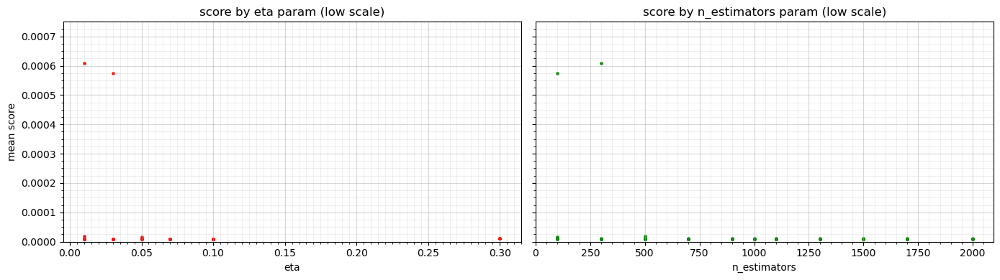

In [62]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

fig, axes = plt.subplots(1, 2, sharey='row')

axes[0].scatter(result_4.param_eta, result_4.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00075])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (low scale)')

axes[1].scatter(result_4.param_n_estimators, result_4.mean_test_score, c='green', s=5)
axes[1].set_xlabel('n_estimators')
axes[1].set_xticks(np.arange(0, 2100, 50), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00075, 0.000025), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (low scale)')

plt.tight_layout()
plt.show()

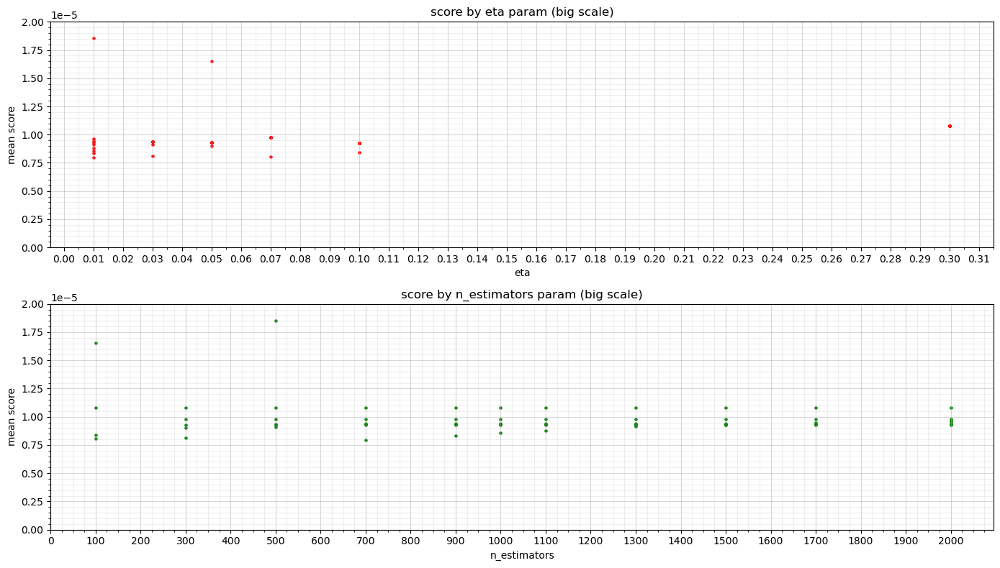

In [63]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 1)

axes[0].scatter(result_4.param_eta, result_4.mean_test_score, c='red', s=5)
axes[0].set_ylabel('mean score')
axes[0].set_xlabel('eta')
axes[0].set_ylim([0.0, 0.00002])
axes[0].set_xticks(np.arange(0.0, 0.32, 0.01))
axes[0].set_xticks(np.arange(0.0, 0.32, 0.005), minor='True')
axes[0].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[0].grid(which='major', alpha=0.5)
axes[0].grid(which='minor', alpha=0.2)
axes[0].set_title('score by eta param (big scale)')

axes[1].scatter(result_4.param_n_estimators, result_4.mean_test_score, c='green', s=5)
axes[1].set_ylabel('mean score')
axes[1].set_xlabel('n_estimators')
axes[1].set_ylim([0.0, 0.00002])
axes[1].set_xticks(np.arange(0, 2100, 100))
axes[1].set_xticks(np.arange(0, 2100, 25), minor='True')
axes[1].set_yticks(np.arange(0.0, 0.00002, 0.0000005), minor='True')
axes[1].grid(which='major', alpha=0.5)
axes[1].grid(which='minor', alpha=0.2)
axes[1].set_title('score by n_estimators param (big scale)')

plt.tight_layout()
plt.show()

In [38]:
pred_train_grid_eta_nest_squared = best_model_eta_nest_squared.predict(X_train)
pred_val_grid_eta_nest_squared = best_model_eta_nest_squared.predict(X_val)
pred_test_grid_eta_nest_squared = best_model_eta_nest_squared.predict(X_test)

pred_train_grid_eta_nest_squared_series = pd.Series(pred_train_grid_eta_nest_squared, index=Y_train.index)
pred_val_grid_eta_nest_squared_series = pd.Series(pred_val_grid_eta_nest_squared, index=Y_val.index)
pred_test_grid_eta_nest_squared_series = pd.Series(pred_test_grid_eta_nest_squared, index=Y_test.index)

rmse_train_grid_eta_nest_squared = math.sqrt(mean_squared_error(Y_train, pred_train_grid_eta_nest_squared))
rmse_val_grid_eta_nest_squared = math.sqrt(mean_squared_error(Y_val, pred_val_grid_eta_nest_squared))
rmse_test_grid_eta_nest_squared = math.sqrt(mean_squared_error(Y_test, pred_test_grid_eta_nest_squared))

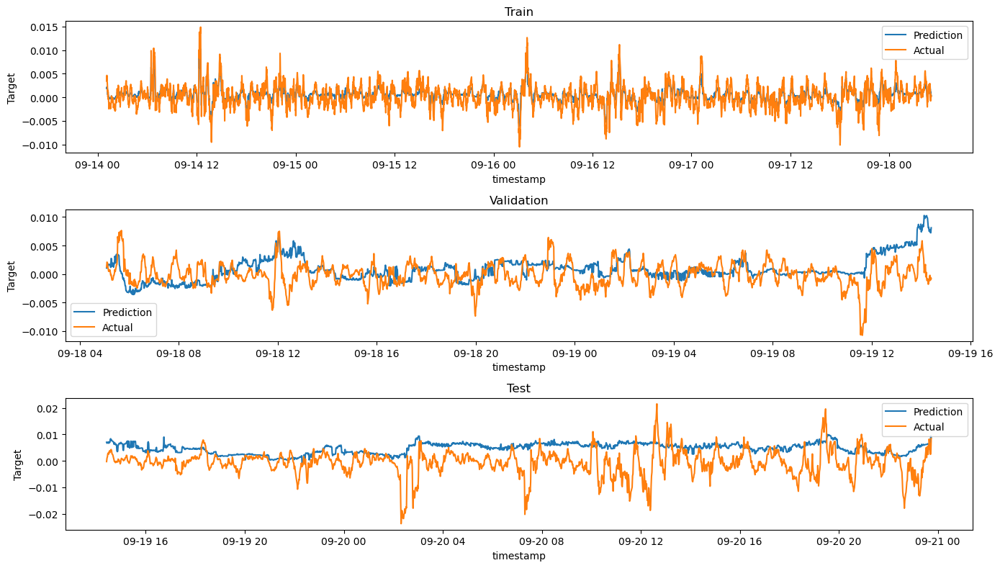

In [65]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(3, 1)

axes[0].plot(pred_train_grid_eta_nest_squared_series, label='Prediction')
axes[0].plot(Y_train, label='Actual')
axes[0].set_title('Train')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('Target')
axes[0].legend()

axes[1].plot(pred_val_grid_eta_nest_squared_series, label='Prediction')
axes[1].plot(Y_val, label='Actual')
axes[1].set_title('Validation')
axes[1].set_ylabel('Target')
axes[1].set_xlabel('timestamp')
axes[1].legend()

axes[2].plot(pred_test_grid_eta_nest_squared_series, label='Prediction')
axes[2].plot(Y_test, label='Actual')
axes[2].set_title('Test')
axes[2].set_ylabel('Target')
axes[2].set_xlabel('timestamp')
axes[2].legend()

fig.tight_layout()
plt.show()

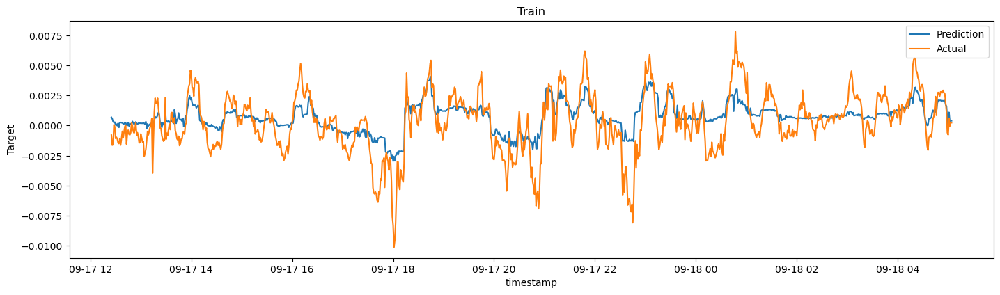

In [66]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

pred_train_grid_eta_nest_squared_series_small = pred_train_grid_eta_nest_squared_series.tail(1000)

fig, axes = plt.subplots(1, 1)
fig.tight_layout()

axes.plot(pred_train_grid_eta_nest_squared_series_small, label='Prediction')
axes.plot(Y_train_small, label='Actual')
axes.set_title('Train')
axes.set_xlabel('timestamp')
axes.set_ylabel('Target')
axes.legend()

plt.show()

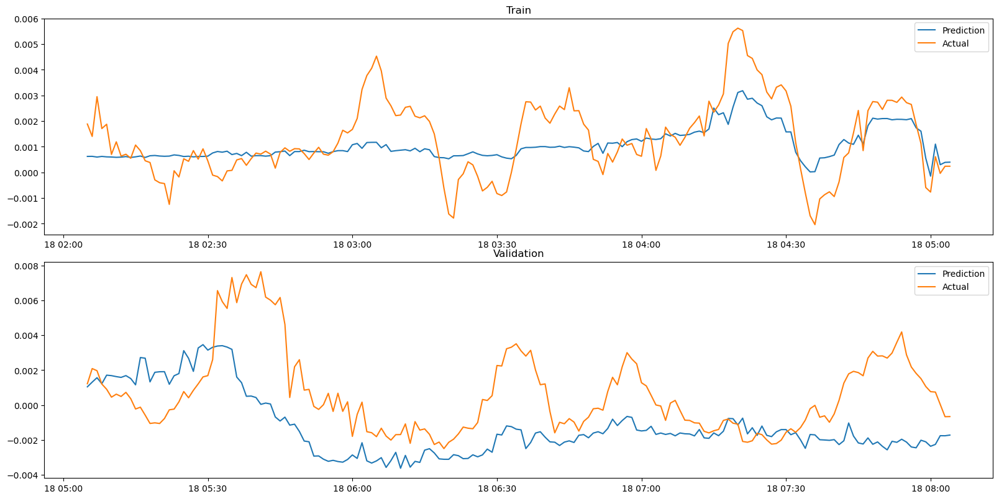

In [67]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})

fig, axes = plt.subplots(2, 1)
fig.tight_layout()

axes[0].plot(pred_train_grid_eta_nest_squared_series.tail(180), label = 'Prediction')
axes[0].plot(Y_train.tail(180), label = 'Actual')
axes[0].set_title('Train')
axes[0].legend()


axes[1].plot(pred_val_grid_eta_nest_squared_series.head(180), label = 'Prediction')
axes[1].plot(Y_val.head(180), label = 'Actual')
axes[1].set_title('Validation')
axes[1].legend()

In [68]:
residual_train_grid_eta_nest_squared = (pred_train_grid_eta_nest_squared - Y_train.Target) / Y_train.Target
residual_val_grid_eta_nest_squared = (pred_val_grid_eta_nest_squared - Y_val.Target) / Y_val.Target
residual_test_grid_eta_nest_squared = (pred_test_grid_eta_nest_squared - Y_test.Target) / Y_test.Target

print('Residual train std: ', residual_train_grid_eta_nest_squared.std())
print('Residual validation std: ', residual_val_grid_eta_nest_squared.std())
print('Residual test std: ', residual_test_grid_eta_nest_squared.std())

Residual train std:  12.827028355480525
Residual validation std:  565.0701421931147
Residual test std:  141.9118226098654


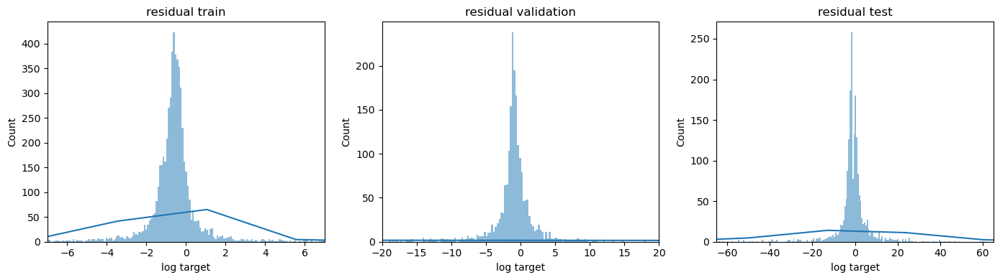

In [69]:
plt.rcParams.update({'figure.figsize': (14, 4), 'figure.dpi': 100})

fig, axes = plt.subplots(1, 3)

sns.histplot(data=residual_train_grid_eta_nest_squared, ax=axes[0], kde=True)
sns.histplot(data=residual_val_grid_eta_nest_squared, ax=axes[1], kde=True)
sns.histplot(data=residual_test_grid_eta_nest_squared, ax=axes[2], kde=True)

axes[0].set_xlim([-7, 7])
axes[0].set_xlabel('log target')
axes[0].set_title('residual train')
axes[1].set_xlim([-20, 20])
axes[1].set_xlabel('log target')
axes[1].set_title('residual validation')
axes[2].set_xlim([-65, 65])
axes[2].set_xlabel('log target')
axes[2].set_title('residual test')

plt.tight_layout()
plt.show()

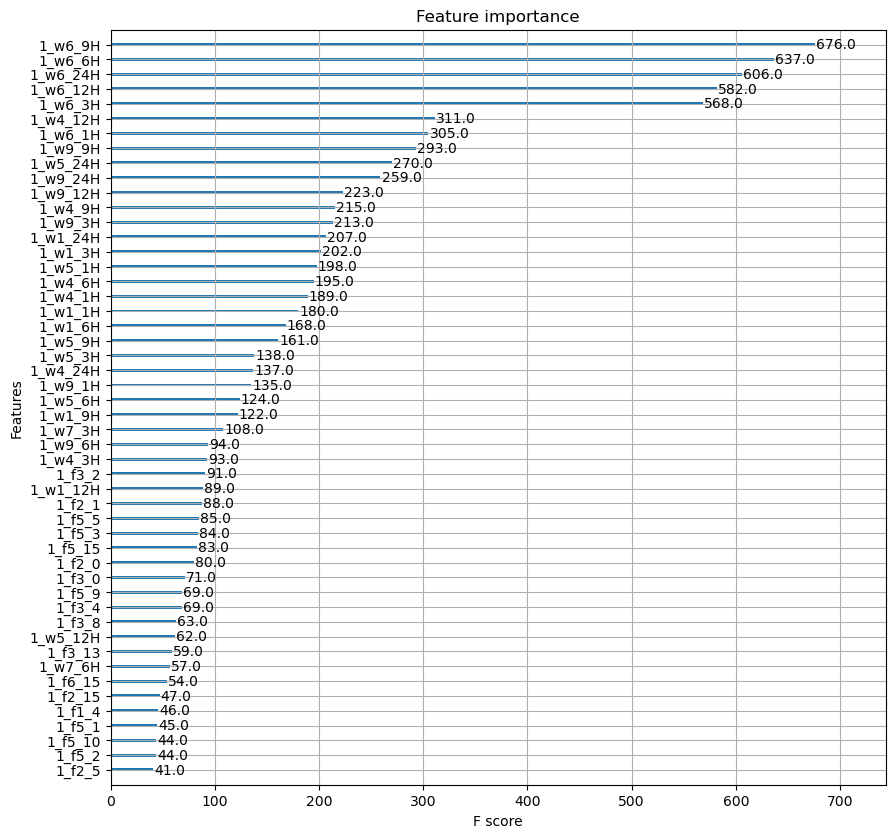

In [70]:
ax = xgboost.plot_importance(best_model_eta_nest_squared, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

#### models rmse comparison

In [41]:
comp_index = ['eta', 'n_estimators', 'rmse train', 'rmse validation', 'rmse test']
comp_cols = ['residual sqrared', 'residual Huber', 'log squared', 'log Huber']
row_eta = [best_eta_squared, best_eta_huber, best_eta_log_squared, best_eta_log_huber]
row_nest = [best_nest_squared, best_nest_huber, best_nest_log_squared, best_nest_log_huber]
row_rmse_train = [rmse_train_grid_eta_nest_squared, rmse_train_grid_eta_nest_huber, rmse_train_grid_eta_nest_log_squared, rmse_train_grid_eta_nest_log_huber]
row_rmse_val = [rmse_val_grid_eta_nest_squared, rmse_val_grid_eta_nest_huber, rmse_val_grid_eta_nest_log_squared, rmse_val_grid_eta_nest_log_huber]
row_rmse_test = [rmse_test_grid_eta_nest_squared, rmse_test_grid_eta_nest_huber, rmse_test_grid_eta_nest_log_squared, rmse_test_grid_eta_nest_log_huber]
model_comparison = pd.DataFrame(data=np.array([row_eta, row_nest, row_rmse_train, row_rmse_val, row_rmse_test]), index=comp_index, columns=comp_cols)
model_comparison

,residual sqrared,residual Huber,log squared,log Huber
eta,0.010000,0.070000,0.010000,0.070000
n_estimators,700.000000,100.000000,700.000000,100.000000
rmse train,0.001563,0.001470,0.001546,0.001480
rmse validation,0.002883,0.002958,0.002946,0.002905
rmse test,0.007302,0.007785,0.007370,0.007801


### grid search secondary params tuning old

In [71]:
# max_depth_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [2, 3, 4, 5],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [72]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=max_depth_params)
# grid_search_model.fit(X_train, Y_train)
# max_depth_tuning_time = time.time() - start

In [73]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_max_depth = best_params['max_depth']

In [74]:
# print("*===max_depth tuning===*")
# print("Best max_depth: ", best_max_depth)
# print("Execution time: ", datetime.timedelta(seconds=round(max_depth_tuning_time)))

*===max_depth tuning===*
Best max_depth:  2
Execution time:  0:00:39


In [75]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

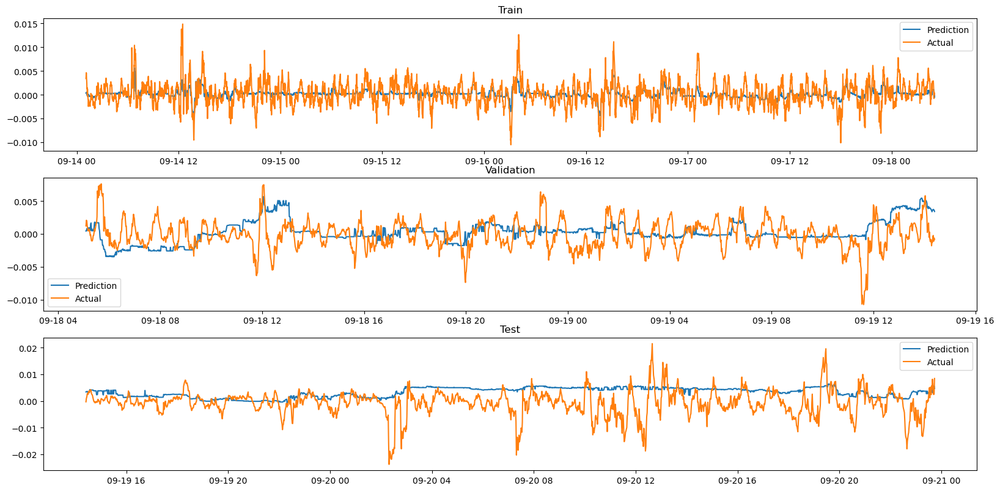

In [76]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [77]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.0025298249642585198
test score:  0.006318081132279273


In [78]:
# subsample_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [best_max_depth],
#     'subsample': [0.1, 0.3, 0.5, 0.7, 1.0],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [79]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=subsample_params)
# grid_search_model.fit(X_train, Y_train)
# subsample_tuning_time = time.time() - start

In [80]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_subsample = best_params['subsample']

In [81]:
# print("*===subsample tuning===*")
# print("Best subsample: ", best_subsample)
# print("Execution time: ", datetime.timedelta(seconds=round(subsample_tuning_time)))

*===subsample tuning===*
Best subsample:  0.1
Execution time:  0:00:21


In [82]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

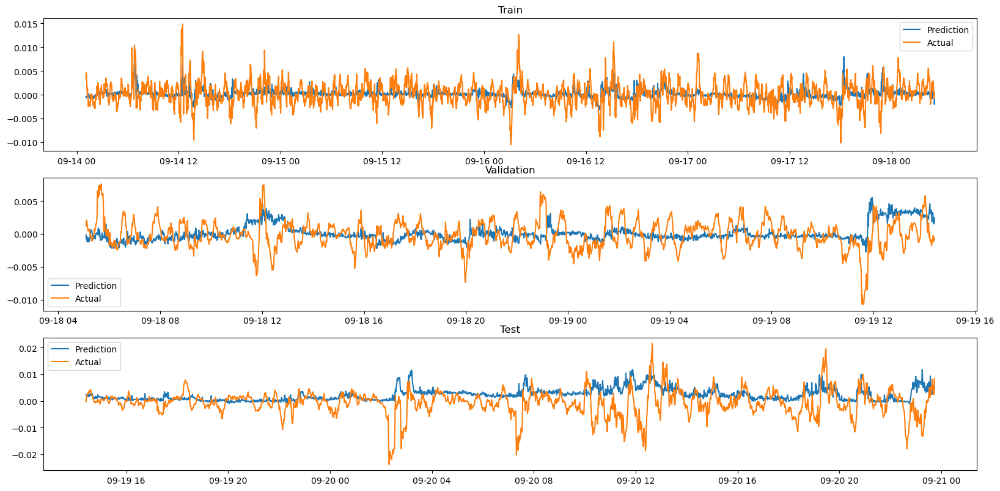

In [83]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [84]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.0023899357979729643
test score:  0.0059448106115712615


In [85]:
# colsample_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [best_max_depth],
#     'subsample': [best_subsample],
#     'colsample_bytree': [0.5, 0.7, 1],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [86]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=colsample_params)
# grid_search_model.fit(X_train, Y_train)
# colsample_tuning_time = time.time() - start

In [87]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_colsample = best_params['colsample_bytree']

In [88]:
# print("*===colsample_bytree tuning===*")
# print("Best colsample_bytree: ", best_colsample)
# print("Execution time: ", datetime.timedelta(seconds=round(colsample_tuning_time)))

*===colsample_bytree tuning===*
Best colsample_bytree:  0.7
Execution time:  0:00:07


In [89]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

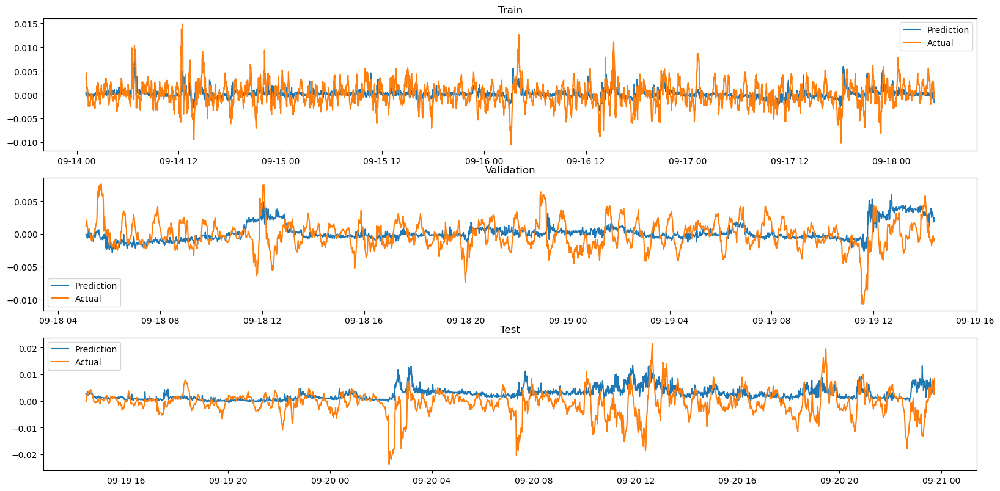

In [90]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [91]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.00239083814506518
test score:  0.006124482281922517


In [92]:
# lambda_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [best_max_depth],
#     'subsample': [best_subsample],
#     'colsample_bytree': [best_colsample],
#     'lambda': [1, 5, 10, 100],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [93]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=lambda_params)
# grid_search_model.fit(X_train, Y_train)
# lambda_tuning_time = time.time() - start

In [94]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_lambda = best_params['lambda']

In [95]:
# print("*===lambda tuning===*")
# print("Best lambda: ", best_lambda)
# print("Execution time: ", datetime.timedelta(seconds=round(lambda_tuning_time)))

*===lambda tuning===*
Best lambda:  100
Execution time:  0:00:08


In [96]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

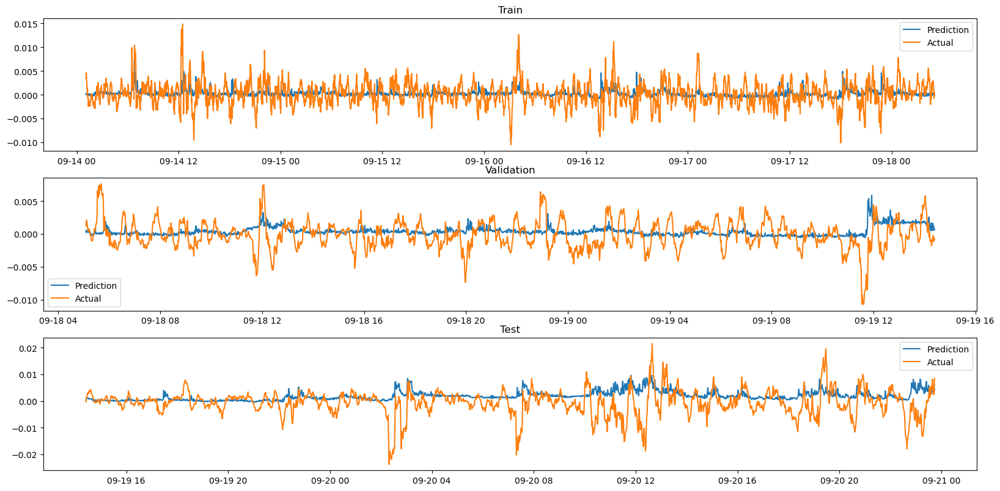

In [97]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [98]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.002234633596645521
test score:  0.00561614545528726


In [99]:
# alpha_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [best_max_depth],
#     'subsample': [best_subsample],
#     'colsample_bytree': [best_colsample],
#     'lambda': [best_lambda],
#     'alpha': [0, 0.001, 0.005, 0.01, 0.05],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [100]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=alpha_params)
# grid_search_model.fit(X_train, Y_train)
# alpha_tuning_time = time.time() - start

In [101]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_alpha = best_params['alpha']

In [102]:
# print("*===alpha tuning===*")
# print("Best alpha: ", best_alpha)
# print("Execution time: ", datetime.timedelta(seconds=round(alpha_tuning_time)))

*===alpha tuning===*
Best alpha:  0.05
Execution time:  0:00:10


In [103]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

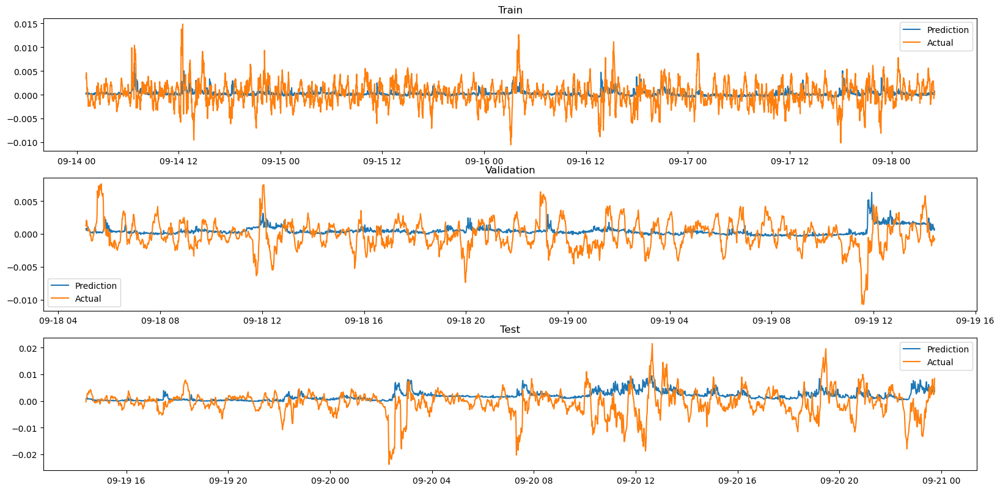

In [104]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [105]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.0022549104488088566
test score:  0.005621278873188081


In [106]:
# gamma_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [best_max_depth],
#     'subsample': [best_subsample],
#     'colsample_bytree': [best_colsample],
#     'lambda': [best_lambda],
#     'alpha': [best_alpha],
#     'gamma': [0, 0.1, 0.2, 0.3],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [107]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=gamma_params)
# grid_search_model.fit(X_train, Y_train)
# gamma_tuning_time = time.time() - start

In [108]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_gamma = best_params['gamma']

In [109]:
# print("*===gamma tuning===*")
# print("Best gamma: ", best_gamma)
# print("Execution time: ", datetime.timedelta(seconds=round(gamma_tuning_time)))

*===gamma tuning===*
Best gamma:  0.1
Execution time:  0:00:08


In [110]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

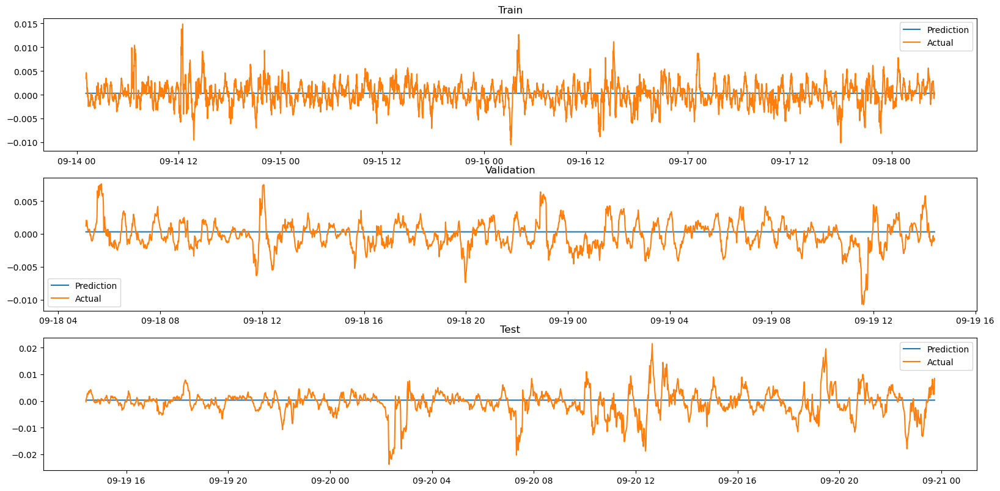

In [111]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [112]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.002186097063700872
test score:  0.004879373178819366


In [113]:
# child_params = {
#     'eta': [best_eta],
#     'n_estimators': [best_nest],
#     'max_depth': [best_max_depth],
#     'subsample': [best_subsample],
#     'colsample_bytree': [best_colsample],
#     'lambda': [best_lambda],
#     'alpha': [best_alpha],
#     'gamma': [best_gamma],
#     'min_child_weight': [1, 2, 3, 4],
#     'eval_metric': ['rmse'],
#     'booster': ['gbtree']
# }

In [114]:
# start = time.time()
# grid_search_model = GridSearchCV(estimator=reg, param_grid=child_params)
# grid_search_model.fit(X_train, Y_train)
# child_tuning_time = time.time() - start

In [115]:
# best_model = grid_search_model.best_estimator_
# best_params = best_model.get_params()
# best_child = best_params['min_child_weight']

In [116]:
# print("*===min_child_weight tuning===*")
# print("Best min_child_weight: ", best_child)
# print("Execution time: ", datetime.timedelta(seconds=round(child_tuning_time)))

*===min_child_weight tuning===*
Best min_child_weight:  1
Execution time:  0:00:08


In [117]:
# pred_train_grid = best_model.predict(X_train)
# pred_val_grid = best_model.predict(X_val)
# pred_test_grid = best_model.predict(X_test)
#
# pred_train_series_grid = pd.Series(pred_train_grid, index=Y_train.index)
# pred_val_series_grid = pd.Series(pred_val_grid, index=Y_val.index)
# pred_test_series_grid = pd.Series(pred_test_grid, index=Y_test.index)
#
# rmse_val_grid = math.sqrt(mean_squared_error(Y_val, pred_val_grid))
# rmse_test_grid = math.sqrt(mean_squared_error(Y_test, pred_test_grid))

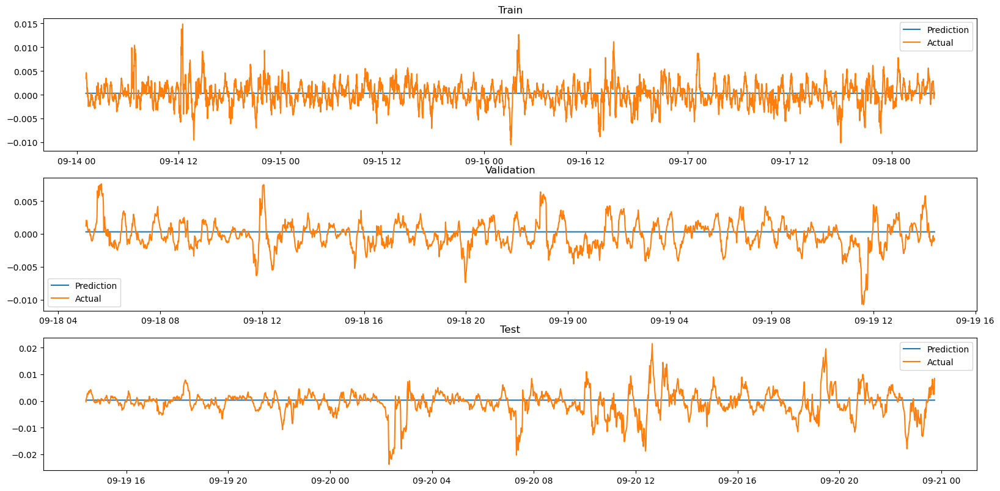

In [118]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_grid, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
#
# axes[1].plot(pred_val_series_grid, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_grid, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

In [119]:
# print("*===eta n_estimators tuning===*")
# print("validation score: ", rmse_val_grid)
# print("test score: ", rmse_test_grid)

*===eta n_estimators tuning===*
validation score:  0.002186097063700872
test score:  0.004879373178819366


In [120]:
# print("Best eta: ", best_eta)
# print("Best n_estimators: ", best_nest)
# print("Best max_depth: ", best_max_depth)
# print("Best subsample: ", best_subsample)
# print("Best colsample_bytree: ", best_colsample)
# print("Best lambda: ", best_lambda)
# print("Best alpha: ", best_alpha)
# print("Best gamma: ", best_gamma)
# print("Best min_child_weight: ", best_child)

Best eta:  0.1
Best n_estimators:  100
Best max_depth:  2
Best subsample:  0.1
Best colsample_bytree:  0.7
Best lambda:  100
Best alpha:  0.05
Best gamma:  0.1
Best min_child_weight:  1


## Random search

In [28]:
params_set_rand_huber = {
    'eta': [0.01],
    'n_estimators': [700],
    'max_depth': [3, 4, 5, 6],
    'subsample': [0.5, 0.7, 1.0],
    'colsample_bytree': [0.5, 0.7, 1.0],
    'lambda': [1, 5, 10, 100],
    'alpha': [0, 0.001, 0.005, 0.01,],
    'gamma': [0, 0.1, 0.2, 0.3],
    'min_child_weight': [1, 2, 3, 4],
    'eval_metric': ['rmse'],
    'booster': ['gbtree'],
    'objective': ['reg:pseudohubererror']
}

#### new params huber log 10 iters

In [53]:
start = time.time()
model_rand_log_huber_10 = RandomizedSearchCV(estimator=reg, param_distributions=params_set_rand_huber, n_iter=10, random_state=1, scoring='neg_root_mean_squared_error')
model_rand_log_huber_10_fit = model_rand_log_huber_10.fit(X_train, Y_new_train)
rand_tuning_time_1 = time.time() - start

In [26]:
# pred_train_rand = best_model.predict(X_train)
# pred_val_rand = best_model.predict(X_val)
# pred_test_rand = best_model.predict(X_test)
#
# pred_train_series_rand = pd.Series(pred_train_rand, index=Y_train.index)
# pred_val_series_rand = pd.Series(pred_val_rand, index=Y_val.index)
# pred_test_series_rand = pd.Series(pred_test_rand, index=Y_test.index)
#
# rmse_val_rand = math.sqrt(mean_squared_error(Y_val, pred_val_rand))
# rmse_test_rand = math.sqrt(mean_squared_error(Y_test, pred_test_rand))

In [54]:
# print("*===RandomCV params list===*")
# params_rand = best_model.get_params()
# for param in params_rand:
#     print(param, ": ", params_rand[param])

In [55]:
# print("*===RandomCV model results===*")
# print("validation score: ", rmse_val_rand)
# print("test score: ", rmse_test_rand)
# print("Execution time: ", datetime.timedelta(seconds=round(model_dur)))

In [56]:
# plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi':100})
#
# fig, axes = plt.subplots(3, 1)
# fig.tight_layout()
#
# axes[0].plot(pred_train_series_rand, label = 'Prediction')
# axes[0].plot(Y_train, label = 'Actual')
# axes[0].set_title('Train')
# axes[0].legend()
#
# axes[1].plot(pred_val_series_rand, label = 'Prediction')
# axes[1].plot(Y_val, label = 'Actual')
# axes[1].set_title('Validation')
# axes[1].legend()
#
# axes[2].plot(pred_test_series_rand, label = 'Prediction')
# axes[2].plot(Y_test, label = 'Actual')
# axes[2].set_title('Test')
# axes[2].legend()

#### new params log target huber 100 iters

In [60]:
start = time.time()
model_rand_log_huber_100 = RandomizedSearchCV(estimator=reg, param_distributions=params_set_rand_huber, n_iter=100, random_state=1, scoring='neg_root_mean_squared_error')
model_rand_log_huber_100_fit = model_rand_log_huber_100.fit(X_train, Y_new_train)
rand_tuning_time_2 = time.time() - start

In [89]:
result_rand_1 = pd.DataFrame(model_rand_log_huber_100_fit.cv_results_)
result_rand_1['mean_test_score'] = -result_rand_1.mean_test_score
result_rand_1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_objective,param_n_estimators,param_min_child_weight,param_max_depth,param_lambda,...,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,7.105398,0.912303,0.008203,0.000747,0.7,reg:pseudohubererror,700,4,3,1,...,0,"{'subsample': 0.7, 'objective': 'reg:pseudohub...",-0.002699,-0.002119,-0.002442,-0.002740,-0.002442,0.002489,0.000223,10
1,8.817213,0.175750,0.007787,0.000410,0.5,reg:pseudohubererror,700,3,5,5,...,0,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002700,-0.002120,-0.002443,-0.002742,-0.002442,0.002489,0.000223,32
2,5.982412,0.183048,0.011587,0.006704,0.5,reg:pseudohubererror,700,2,6,10,...,0.001,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002700,-0.002120,-0.002445,-0.002743,-0.002444,0.002490,0.000223,52
3,5.438599,0.146124,0.009201,0.000750,0.7,reg:pseudohubererror,700,4,4,5,...,0.01,"{'subsample': 0.7, 'objective': 'reg:pseudohub...",-0.002738,-0.002264,-0.002807,-0.002737,-0.002491,0.002607,0.000203,82
4,11.039001,0.219245,0.008398,0.000487,1.0,reg:pseudohubererror,700,1,6,10,...,0.005,"{'subsample': 1.0, 'objective': 'reg:pseudohub...",-0.002700,-0.002120,-0.002443,-0.002741,-0.002442,0.002489,0.000223,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,8.608278,0.285114,0.009400,0.001198,0.7,reg:pseudohubererror,700,2,6,5,...,0.005,"{'subsample': 0.7, 'objective': 'reg:pseudohub...",-0.002700,-0.002120,-0.002443,-0.002742,-0.002443,0.002489,0.000223,33
96,7.391708,0.235372,0.008601,0.000800,0.5,reg:pseudohubererror,700,3,3,1,...,0.01,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002700,-0.002119,-0.002443,-0.002741,-0.002442,0.002489,0.000223,30
97,5.993425,0.216504,0.009800,0.001324,1.0,reg:pseudohubererror,700,1,3,100,...,0.005,"{'subsample': 1.0, 'objective': 'reg:pseudohub...",-0.002931,-0.002136,-0.002755,-0.002769,-0.002440,0.002606,0.000284,81
98,6.450731,0.130937,0.008398,0.000799,0.5,reg:pseudohubererror,700,3,6,5,...,0.001,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002700,-0.002120,-0.002443,-0.002742,-0.002442,0.002489,0.000223,40


In [90]:
best_model_rand_log_huber_100 = model_rand_log_huber_100_fit.best_estimator_
best_params_rand_log_huber_100 = best_model_rand_log_huber_100.get_params()
best_max_depth_rand_log_huber_100 = best_params_rand_log_huber_100['max_depth']
best_subsample_rand_log_huber_100 = best_params_rand_log_huber_100['subsample']
best_colsample_rand_log_huber_100 = best_params_rand_log_huber_100['colsample_bytree']
best_lambda_rand_log_huber_100 = best_params_rand_log_huber_100['lambda']
best_alpha_rand_log_huber_100 = best_params_rand_log_huber_100['alpha']
best_gamma_rand_log_huber_100 = best_params_rand_log_huber_100['gamma']
best_weight_rand_log_huber_100 = best_params_rand_log_huber_100['min_child_weight']

In [91]:
print('Best max_depth: ', best_max_depth_rand_log_huber_100)
print('Best subsample: ', best_subsample_rand_log_huber_100)
print('Best colsample_bytree: ', best_colsample_rand_log_huber_100)
print('Best lambda: ', best_lambda_rand_log_huber_100)
print('Best alpha: ', best_alpha_rand_log_huber_100)
print('Best gamma: ', best_gamma_rand_log_huber_100)
print('Best min_child_weight: ', best_weight_rand_log_huber_100)

Best max_depth:  6
Best subsample:  1.0
Best colsample_bytree:  1.0
Best lambda:  1
Best alpha:  0
Best gamma:  0.3
Best min_child_weight:  4


In [92]:
pred_train_rand_log_huber_100 = model_rand_log_huber_100_fit.predict(X_train)
pred_val_rand_log_huber_100 = model_rand_log_huber_100_fit.predict(X_val)
pred_test_rand_log_huber_100 = model_rand_log_huber_100_fit.predict(X_test)

pred_train_series_rand_log_huber_100 = pd.Series(pred_train_rand_log_huber_100, index=Y_new_train.index)
pred_val_series_rand_log_huber_100 = pd.Series(pred_val_rand_log_huber_100, index=Y_new_val.index)
pred_test_series_rand_log_huber_100 = pd.Series(pred_test_rand_log_huber_100, index=Y_new_test.index)

rmse_train_rand_log_huber_100 = math.sqrt(mean_squared_error(Y_new_train, pred_train_rand_log_huber_100))
rmse_val_rand_log_huber_100 = math.sqrt(mean_squared_error(Y_new_val, pred_val_rand_log_huber_100))
rmse_test_rand_log_huber_100 = math.sqrt(mean_squared_error(Y_new_test, pred_test_rand_log_huber_100))

In [93]:
print("*===Model results===*")
print("train score: ", rmse_train_rand_log_huber_100)
print("validation score: ", rmse_val_rand_log_huber_100)
print("test score: ", rmse_test_rand_log_huber_100)
print("Execution time: ", datetime.timedelta(seconds=round(rand_tuning_time_2)))

*===Model results===*
train score:  0.002493794273571796
validation score:  0.0022496697107338374
test score:  0.004951936734320636
Execution time:  1:13:11


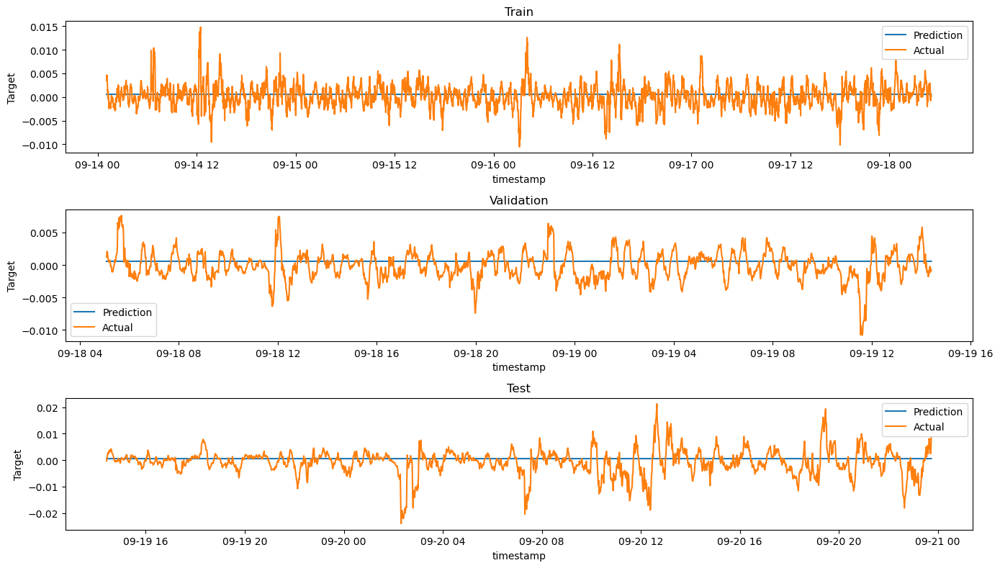

In [94]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(3, 1)

axes[0].plot(pred_train_series_rand_log_huber_100, label='Prediction')
axes[0].plot(Y_new_train, label='Actual')
axes[0].set_title('Train')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('Target')
axes[0].legend()

axes[1].plot(pred_val_series_rand_log_huber_100, label='Prediction')
axes[1].plot(Y_new_val, label='Actual')
axes[1].set_title('Validation')
axes[1].set_ylabel('Target')
axes[1].set_xlabel('timestamp')
axes[1].legend()

axes[2].plot(pred_test_series_rand_log_huber_100, label='Prediction')
axes[2].plot(Y_new_test, label='Actual')
axes[2].set_title('Test')
axes[2].set_ylabel('Target')
axes[2].set_xlabel('timestamp')
axes[2].legend()

fig.tight_layout()
plt.show()

In [82]:
ax = xgboost.plot_importance(best_model_rand_log_huber_100, max_num_features=50)
fig = ax.figure
fig.set_size_inches(10, 10)

ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.

#### new params old target huber 100 iters

In [95]:
start = time.time()
model_rand_quad_huber_100 = RandomizedSearchCV(estimator=reg, param_distributions=params_set_rand_huber, n_iter=100, random_state=1, scoring='neg_root_mean_squared_error')
model_rand_quad_huber_100_fit = model_rand_quad_huber_100.fit(X_train, Y_train)
rand_tuning_time_3 = time.time() - start

In [96]:
result_rand_2 = pd.DataFrame(model_rand_quad_huber_100_fit.cv_results_)
result_rand_2['mean_test_score'] = -result_rand_2.mean_test_score
result_rand_2

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_objective,param_n_estimators,param_min_child_weight,param_max_depth,param_lambda,...,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,6.747399,0.856836,0.008002,0.000633,0.7,reg:pseudohubererror,700,4,3,1,...,0,"{'subsample': 0.7, 'objective': 'reg:pseudohub...",-0.002705,-0.002120,-0.002443,-0.002741,-0.002441,0.002490,0.000224,10
1,8.603806,0.150527,0.008196,0.000404,0.5,reg:pseudohubererror,700,3,5,5,...,0,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002705,-0.002121,-0.002444,-0.002743,-0.002442,0.002491,0.000224,32
2,5.937428,0.166587,0.007773,0.000401,0.5,reg:pseudohubererror,700,2,6,10,...,0.001,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002705,-0.002121,-0.002446,-0.002744,-0.002443,0.002492,0.000224,52
3,5.364798,0.155889,0.009201,0.000401,0.7,reg:pseudohubererror,700,4,4,5,...,0.01,"{'subsample': 0.7, 'objective': 'reg:pseudohub...",-0.002743,-0.002252,-0.002805,-0.002738,-0.002474,0.002603,0.000209,81
4,10.911209,0.193342,0.008391,0.001005,1.0,reg:pseudohubererror,700,1,6,10,...,0.005,"{'subsample': 1.0, 'objective': 'reg:pseudohub...",-0.002705,-0.002121,-0.002444,-0.002742,-0.002442,0.002491,0.000224,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9.539414,0.210848,0.008986,0.000638,0.7,reg:pseudohubererror,700,2,6,5,...,0.005,"{'subsample': 0.7, 'objective': 'reg:pseudohub...",-0.002705,-0.002121,-0.002444,-0.002743,-0.002442,0.002491,0.000224,33
96,8.664808,0.150712,0.009600,0.000802,0.5,reg:pseudohubererror,700,3,3,1,...,0.01,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002705,-0.002120,-0.002444,-0.002742,-0.002442,0.002491,0.000224,30
97,6.941210,0.324272,0.009601,0.000801,1.0,reg:pseudohubererror,700,1,3,100,...,0.005,"{'subsample': 1.0, 'objective': 'reg:pseudohub...",-0.002935,-0.002137,-0.002757,-0.002767,-0.002437,0.002607,0.000285,82
98,7.415200,0.170999,0.009401,0.000799,0.5,reg:pseudohubererror,700,3,6,5,...,0.001,"{'subsample': 0.5, 'objective': 'reg:pseudohub...",-0.002705,-0.002121,-0.002444,-0.002743,-0.002442,0.002491,0.000224,40


In [ ]:
best_model_rand_quad_huber_100 = model_rand_quad_huber_100_fit.best_estimator_
best_params_rand_quad_huber_100 = best_model_rand_quad_huber_100.get_params()
best_max_depth_rand_quad_huber_100 = best_params_rand_log_huber_100['max_depth']
best_subsample_rand_quad_huber_100 = best_params_rand_log_huber_100['subsample']
best_colsample_rand_quad_huber_100 = best_params_rand_log_huber_100['colsample_bytree']
best_lambda_rand_log_huber_100 = best_params_rand_log_huber_100['lambda']
best_alpha_rand_log_huber_100 = best_params_rand_log_huber_100['alpha']
best_gamma_rand_log_huber_100 = best_params_rand_log_huber_100['gamma']
best_weight_rand_log_huber_100 = best_params_rand_log_huber_100['min_child_weight']

#### Random serach eta n_estimators

In [21]:
eta_nest_params_new_huber = {
    'eta': [0.01, 0.03, 0.05, 0.07, 0.1, 0.3],
    'n_estimators': [100, 300, 500, 700, 900, 1000, 1100, 1300, 1500, 1700, 2000],
    'eval_metric': ['rmse'],
    'booster': ['gbtree'],
    'objective': ['reg:pseudohubererror']
}

In [22]:
start = time.time()
model_rand_log_huber_eta_nest = RandomizedSearchCV(estimator=reg, param_distributions=eta_nest_params_new_huber, n_iter=66, random_state=1, scoring='neg_root_mean_squared_error')
model_rand_log_huber_eta_nest_fit = model_rand_log_huber_eta_nest.fit(X_train, Y_new_train)
rand_tuning_time_4 = time.time() - start

In [24]:
best_model_rand_eta_nest_huber = model_rand_log_huber_eta_nest_fit.best_estimator_
best_params_rand_eta_nest_huber = best_model_rand_eta_nest_huber.get_params()
best_eta_huber_rand = best_params_rand_eta_nest_huber['eta']
best_nest_huber_rand = best_params_rand_eta_nest_huber['n_estimators']

In [25]:
print("*===eta n_estimators rand huber tuning===*")
print("Best eta: ", best_eta_huber_rand)
print("Best n_estimators: ", best_nest_huber_rand)
print("Execution time: ", datetime.timedelta(seconds=round(rand_tuning_time_4)))

*===eta n_estimators rand huber tuning===*
Best eta:  0.07
Best n_estimators:  100
Execution time:  1:42:22


In [23]:
result_rand_4 = pd.DataFrame(model_rand_log_huber_eta_nest_fit.cv_results_)
result_rand_4['mean_test_score'] = -result_rand_4.mean_test_score
result_rand_4

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_objective,param_n_estimators,param_eval_metric,param_eta,param_booster,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.225041,0.276567,0.010200,0.001166,reg:pseudohubererror,100,rmse,0.01,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.165410,-0.165438,-0.165928,-0.165948,-0.165744,0.165694,0.000232,66
1,3.178694,0.323443,0.008799,0.000748,reg:pseudohubererror,300,rmse,0.01,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.021942,-0.021719,-0.022380,-0.022364,-0.022135,0.022108,0.000253,65
2,11.339800,1.445940,0.010000,0.000632,reg:pseudohubererror,500,rmse,0.01,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.003619,-0.003473,-0.004658,-0.004140,-0.004151,0.004008,0.000424,63
3,22.723199,0.084964,0.012601,0.000800,reg:pseudohubererror,700,rmse,0.01,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.002784,-0.002522,-0.003011,-0.002836,-0.002826,0.002796,0.000157,2
4,30.636001,2.857629,0.014999,0.000630,reg:pseudohubererror,900,rmse,0.01,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.002959,-0.002642,-0.002958,-0.002858,-0.002896,0.002862,0.000117,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,10.664400,0.257808,0.008201,0.000398,reg:pseudohubererror,1100,rmse,0.3,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.003555,-0.002851,-0.003255,-0.002890,-0.003306,0.003171,0.000266,55
62,12.274598,0.338901,0.008203,0.000401,reg:pseudohubererror,1300,rmse,0.3,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.003555,-0.002851,-0.003255,-0.002890,-0.003306,0.003171,0.000266,54
63,13.173813,0.035834,0.008587,0.000480,reg:pseudohubererror,1500,rmse,0.3,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.003555,-0.002851,-0.003255,-0.002890,-0.003306,0.003171,0.000266,53
64,14.679642,0.110648,0.009379,0.000493,reg:pseudohubererror,1700,rmse,0.3,gbtree,"{'objective': 'reg:pseudohubererror', 'n_estim...",-0.003555,-0.002851,-0.003255,-0.002890,-0.003306,0.003171,0.000266,52


In [26]:
pred_train_rand_eta_nest_huber = best_model_rand_eta_nest_huber.predict(X_train)
pred_val_rand_eta_nest_huber = best_model_rand_eta_nest_huber.predict(X_val)
pred_test_rand_eta_nest_huber = best_model_rand_eta_nest_huber.predict(X_test)

pred_train_rand_eta_nest_huber_series = pd.Series(pred_train_rand_eta_nest_huber, index=Y_new_train.index)
pred_val_rand_eta_nest_huber_series = pd.Series(pred_val_rand_eta_nest_huber, index=Y_new_val.index)
pred_test_rand_eta_nest_huber_series = pd.Series(pred_test_rand_eta_nest_huber, index=Y_new_test.index)

rmse_train_rand_eta_nest_huber = math.sqrt(mean_squared_error(Y_new_train, pred_train_rand_eta_nest_huber))
rmse_val_rand_eta_nest_huber = math.sqrt(mean_squared_error(Y_new_val, pred_val_rand_eta_nest_huber))
rmse_test_rand_eta_nest_huber = math.sqrt(mean_squared_error(Y_new_test, pred_test_rand_eta_nest_huber))

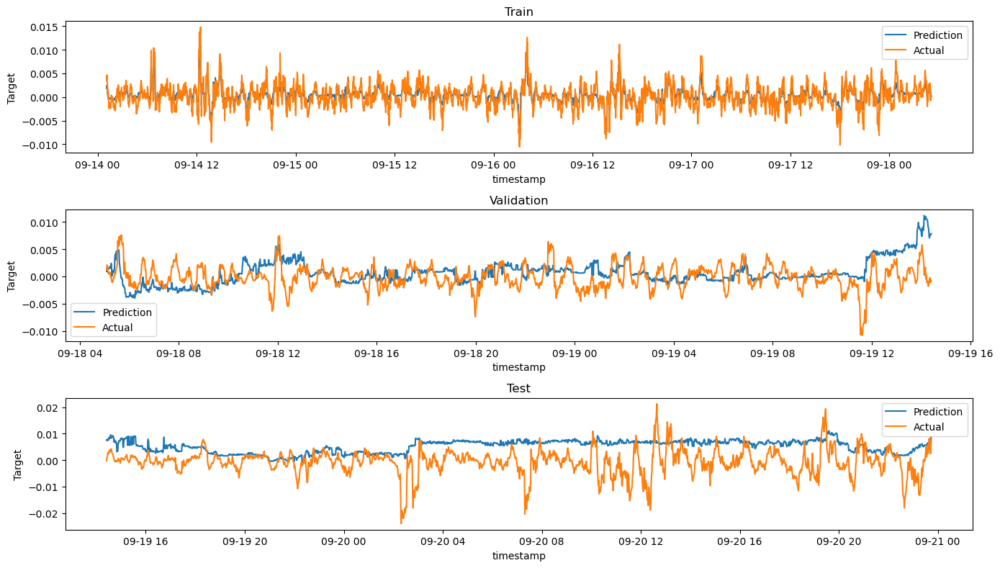

In [27]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(3, 1)

axes[0].plot(pred_train_rand_eta_nest_huber_series, label='Prediction')
axes[0].plot(Y_new_train, label='Actual')
axes[0].set_title('Train')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('Target')
axes[0].legend()

axes[1].plot(pred_val_rand_eta_nest_huber_series, label='Prediction')
axes[1].plot(Y_new_val, label='Actual')
axes[1].set_title('Validation')
axes[1].set_ylabel('Target')
axes[1].set_xlabel('timestamp')
axes[1].legend()

axes[2].plot(pred_test_rand_eta_nest_huber_series, label='Prediction')
axes[2].plot(Y_new_test, label='Actual')
axes[2].set_title('Test')
axes[2].set_ylabel('Target')
axes[2].set_xlabel('timestamp')
axes[2].legend()

fig.tight_layout()
plt.show()

In [28]:
print("*===RandomCV eta n_estimators model results===*")
print("train score: ", rmse_train_rand_eta_nest_huber)
print("validation score: ", rmse_val_rand_eta_nest_huber)
print("test score: ", rmse_test_rand_eta_nest_huber)

*===RandomCV eta n_estimators model results===*
train score:  0.0014795316451075183
validation score:  0.002905006978072445
test score:  0.007800860487420297


## Features analysis

#### Lag features

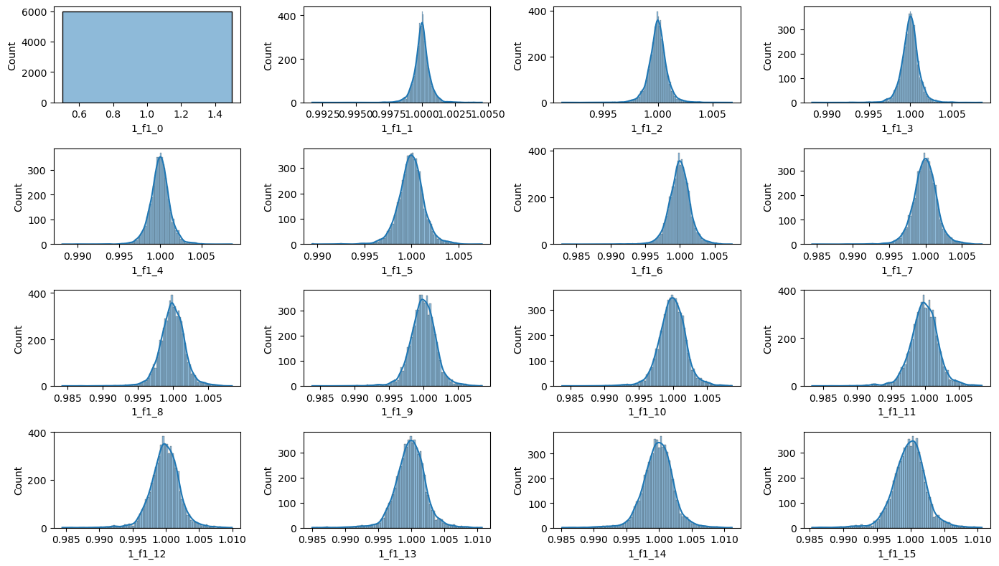

In [13]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(4, 4)

sns.histplot(data=X_train['1_f1_0'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_f1_1'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_f1_2'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_f1_3'], kde=True, ax=axes[0, 3])
sns.histplot(data=X_train['1_f1_4'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_f1_5'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_f1_6'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_f1_7'], kde=True, ax=axes[1, 3])
sns.histplot(data=X_train['1_f1_8'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_train['1_f1_9'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_train['1_f1_10'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_f1_11'], kde=True, ax=axes[2, 3])
sns.histplot(data=X_train['1_f1_12'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_train['1_f1_13'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_train['1_f1_14'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_f1_15'], kde=True, ax=axes[3, 3])

plt.tight_layout()
plt.show()

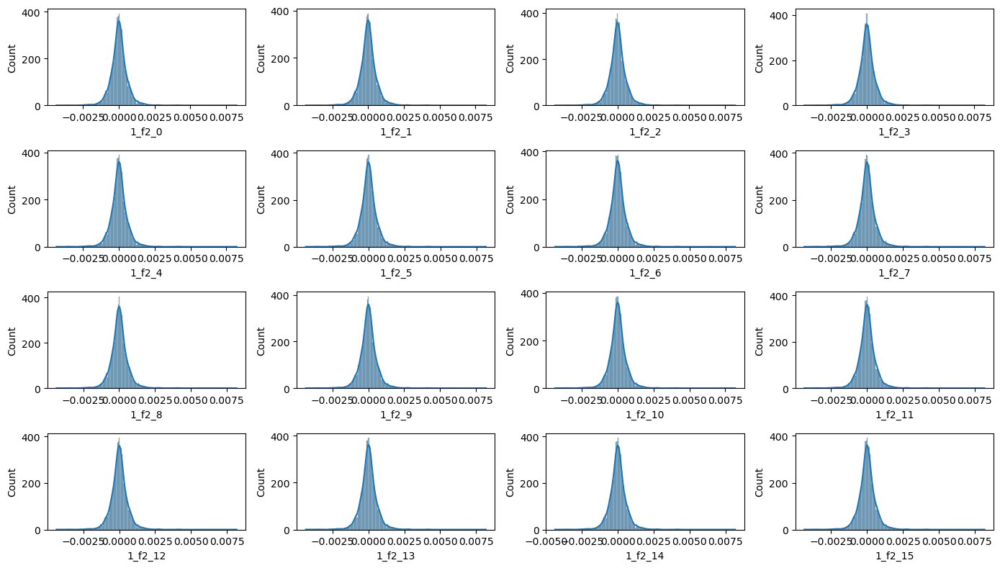

In [14]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(4, 4)

sns.histplot(data=X_train['1_f2_0'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_f2_1'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_f2_2'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_f2_3'], kde=True, ax=axes[0, 3])
sns.histplot(data=X_train['1_f2_4'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_f2_5'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_f2_6'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_f2_7'], kde=True, ax=axes[1, 3])
sns.histplot(data=X_train['1_f2_8'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_train['1_f2_9'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_train['1_f2_10'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_f2_11'], kde=True, ax=axes[2, 3])
sns.histplot(data=X_train['1_f2_12'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_train['1_f2_13'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_train['1_f2_14'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_f2_15'], kde=True, ax=axes[3, 3])

plt.tight_layout()
plt.show()

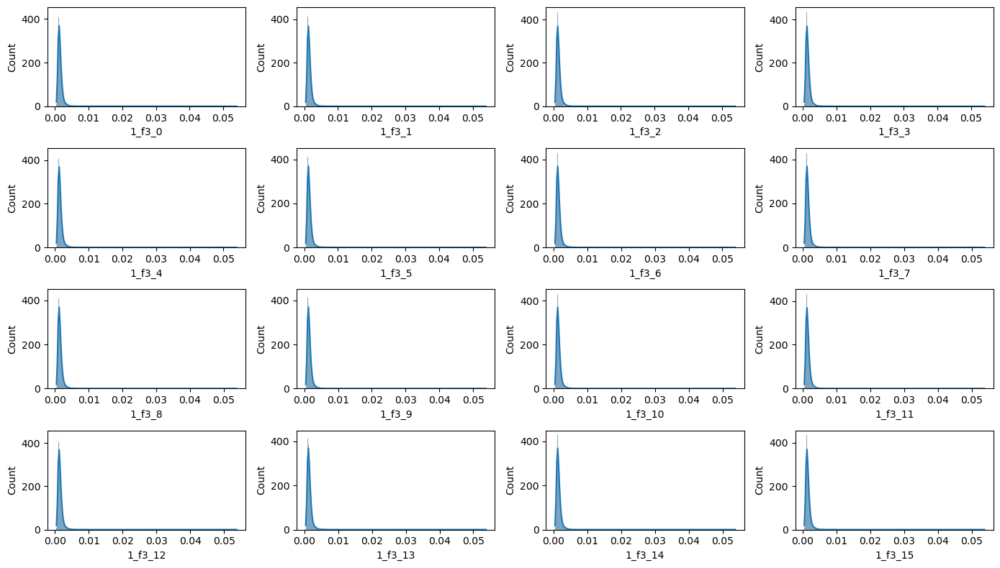

In [15]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(4, 4)

sns.histplot(data=X_train['1_f3_0'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_f3_1'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_f3_2'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_f3_3'], kde=True, ax=axes[0, 3])
sns.histplot(data=X_train['1_f3_4'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_f3_5'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_f3_6'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_f3_7'], kde=True, ax=axes[1, 3])
sns.histplot(data=X_train['1_f3_8'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_train['1_f3_9'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_train['1_f3_10'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_f3_11'], kde=True, ax=axes[2, 3])
sns.histplot(data=X_train['1_f3_12'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_train['1_f3_13'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_train['1_f3_14'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_f3_15'], kde=True, ax=axes[3, 3])

plt.tight_layout()
plt.show()

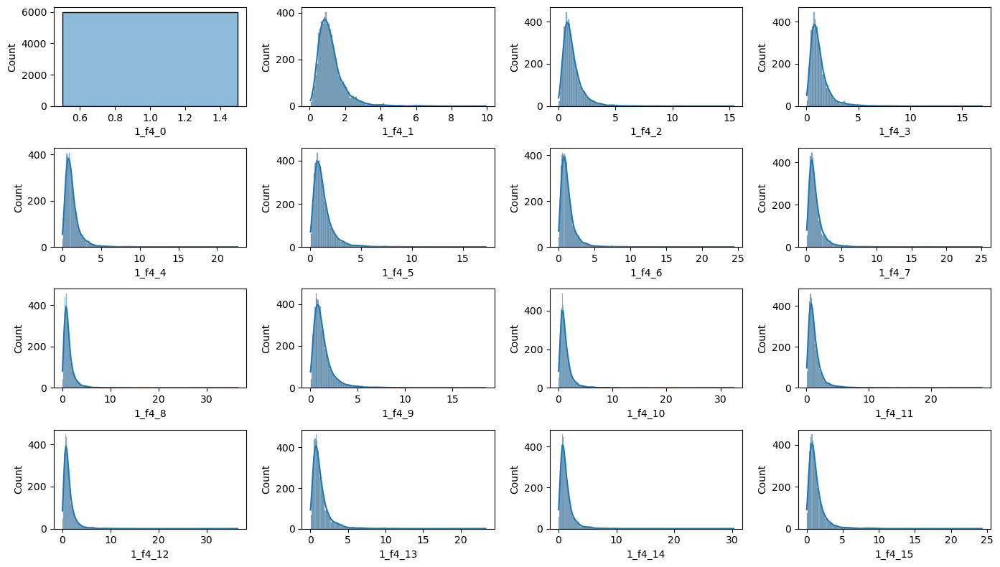

In [16]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(4, 4)

sns.histplot(data=X_train['1_f4_0'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_f4_1'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_f4_2'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_f4_3'], kde=True, ax=axes[0, 3])
sns.histplot(data=X_train['1_f4_4'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_f4_5'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_f4_6'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_f4_7'], kde=True, ax=axes[1, 3])
sns.histplot(data=X_train['1_f4_8'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_train['1_f4_9'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_train['1_f4_10'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_f4_11'], kde=True, ax=axes[2, 3])
sns.histplot(data=X_train['1_f4_12'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_train['1_f4_13'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_train['1_f4_14'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_f4_15'], kde=True, ax=axes[3, 3])

plt.tight_layout()
plt.show()

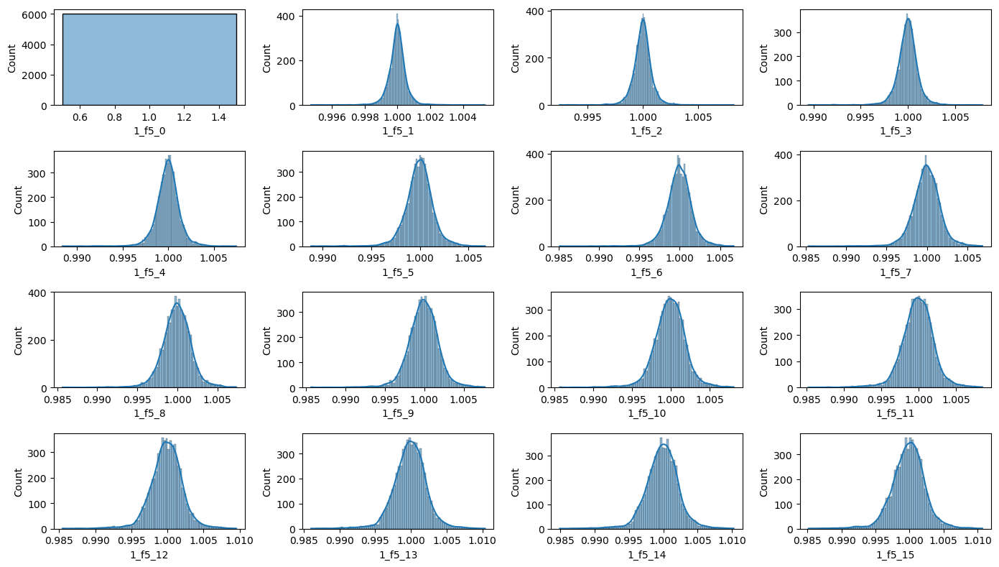

In [17]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(4, 4)

sns.histplot(data=X_train['1_f5_0'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_f5_1'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_f5_2'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_f5_3'], kde=True, ax=axes[0, 3])
sns.histplot(data=X_train['1_f5_4'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_f5_5'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_f5_6'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_f5_7'], kde=True, ax=axes[1, 3])
sns.histplot(data=X_train['1_f5_8'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_train['1_f5_9'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_train['1_f5_10'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_f5_11'], kde=True, ax=axes[2, 3])
sns.histplot(data=X_train['1_f5_12'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_train['1_f5_13'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_train['1_f5_14'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_f5_15'], kde=True, ax=axes[3, 3])

plt.tight_layout()
plt.show()

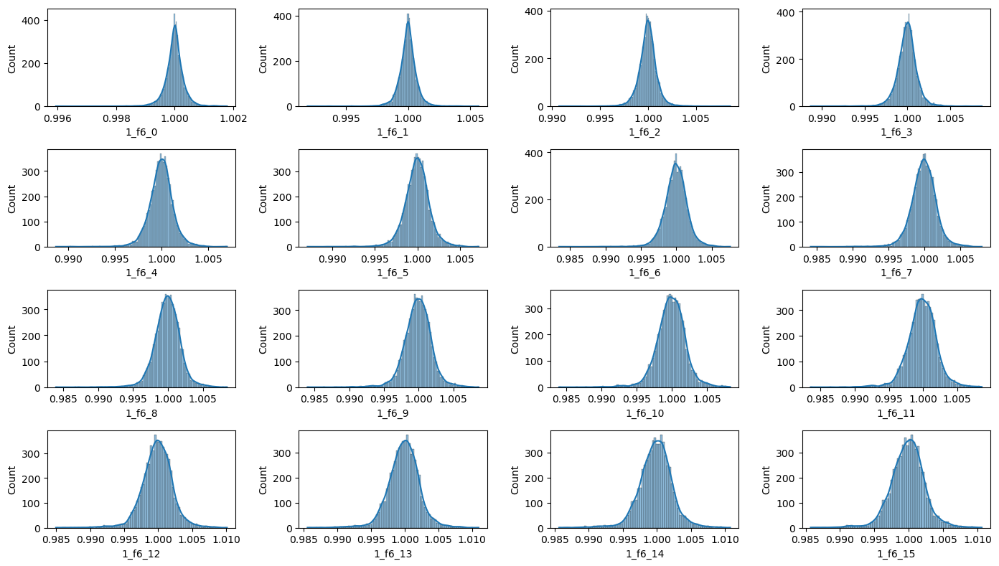

In [18]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(4, 4)

sns.histplot(data=X_train['1_f6_0'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_f6_1'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_f6_2'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_f6_3'], kde=True, ax=axes[0, 3])
sns.histplot(data=X_train['1_f6_4'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_f6_5'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_f6_6'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_f6_7'], kde=True, ax=axes[1, 3])
sns.histplot(data=X_train['1_f6_8'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_train['1_f6_9'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_train['1_f6_10'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_f6_11'], kde=True, ax=axes[2, 3])
sns.histplot(data=X_train['1_f6_12'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_train['1_f6_13'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_train['1_f6_14'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_f6_15'], kde=True, ax=axes[3, 3])

plt.tight_layout()
plt.show()

#### Windows averages

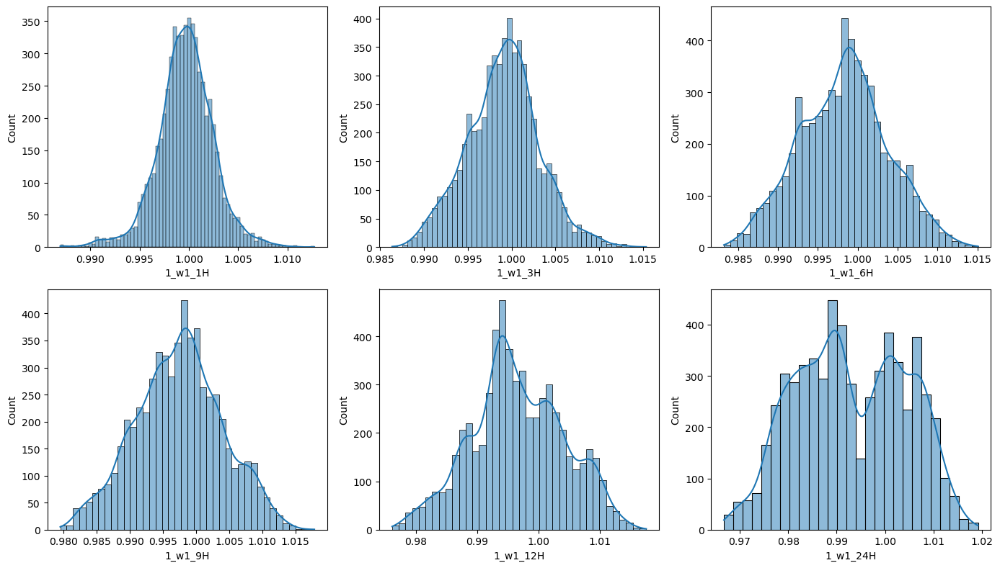

In [23]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w1_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w1_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w1_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w1_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w1_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w1_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

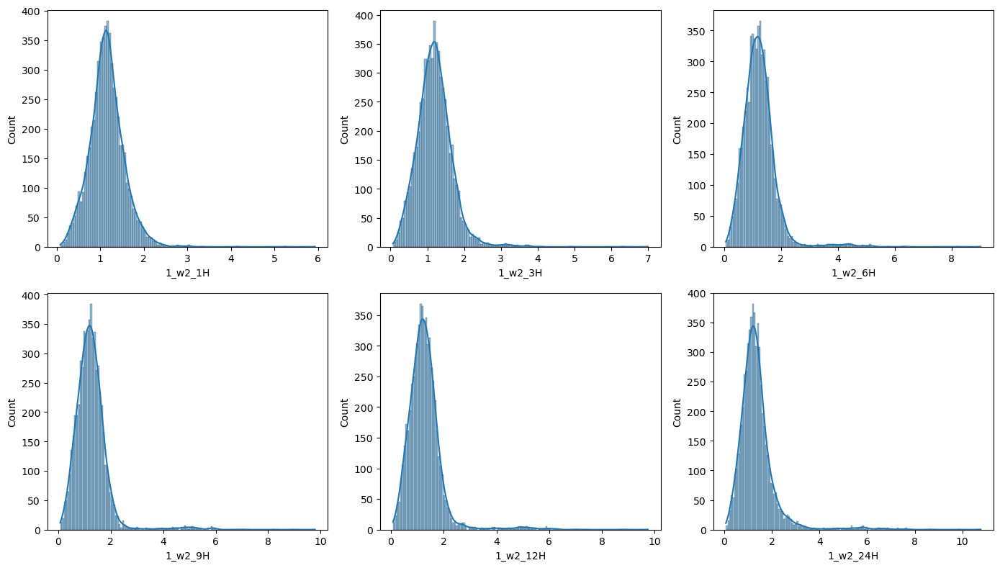

In [26]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w2_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w2_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w2_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w2_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w2_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w2_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

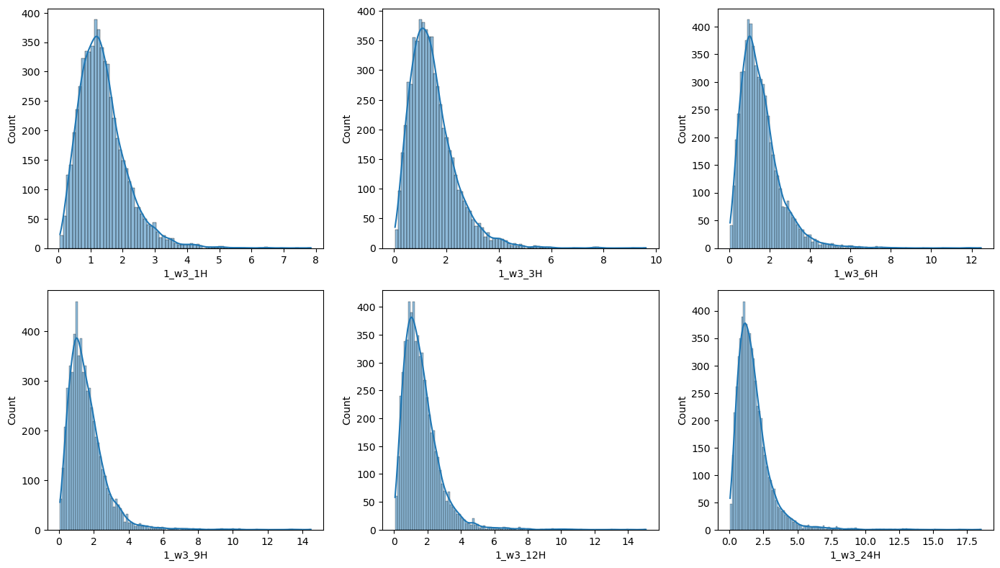

In [27]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w3_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w3_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w3_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w3_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w3_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w3_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

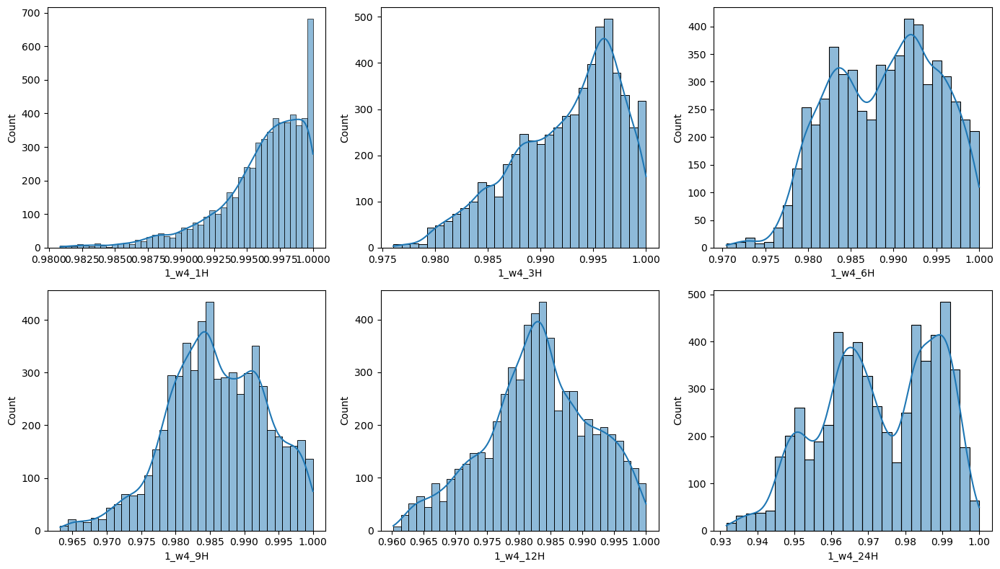

In [28]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w4_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w4_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w4_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w4_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w4_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w4_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

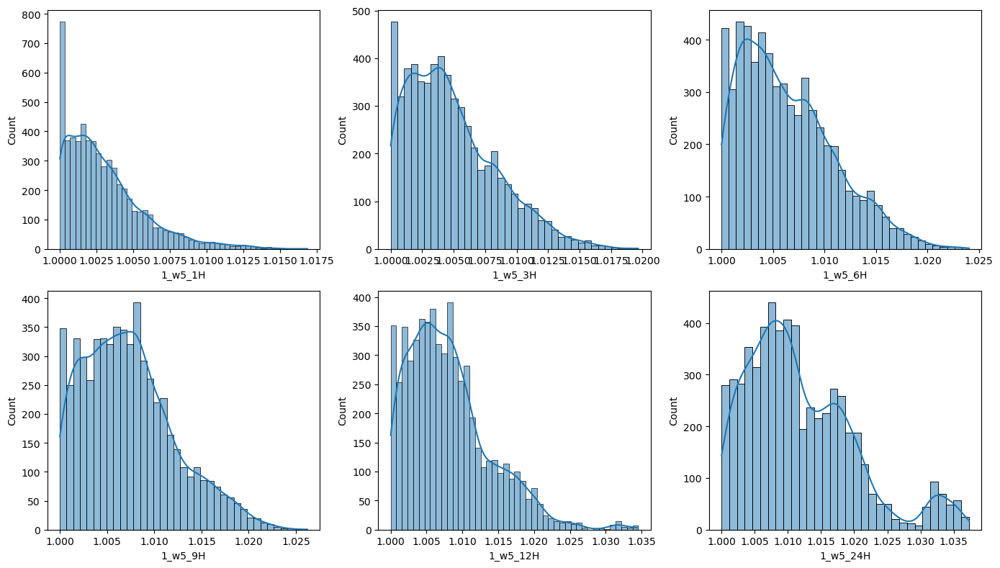

In [29]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w5_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w5_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w5_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w5_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w5_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w5_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

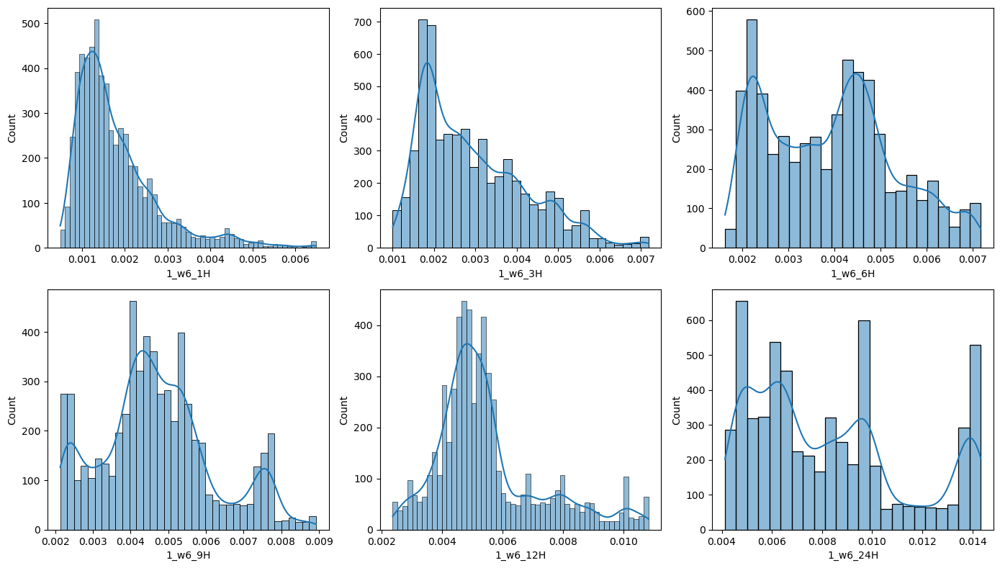

In [25]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w6_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w6_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w6_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w6_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w6_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w6_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

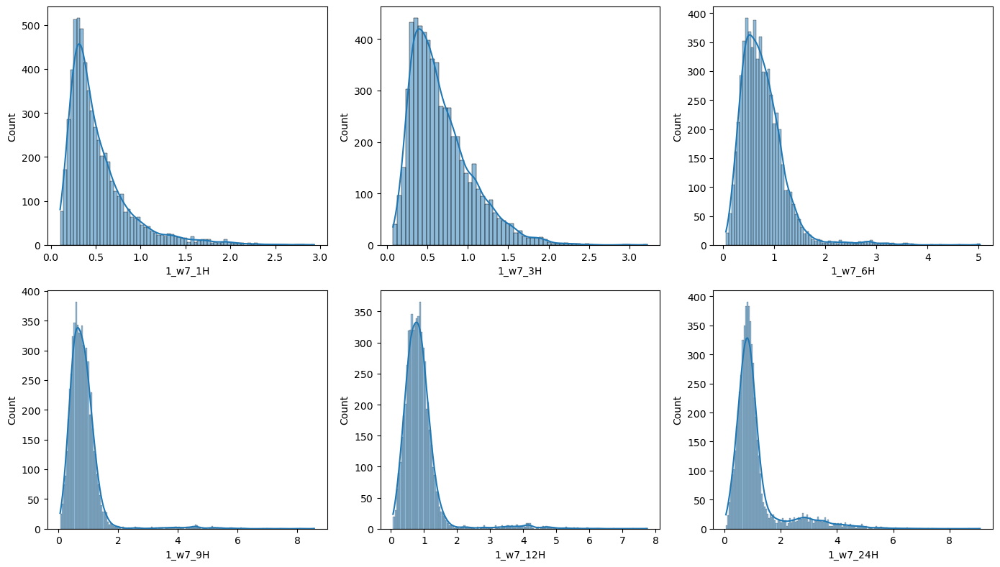

In [30]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w7_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w7_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w7_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w7_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w7_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w7_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

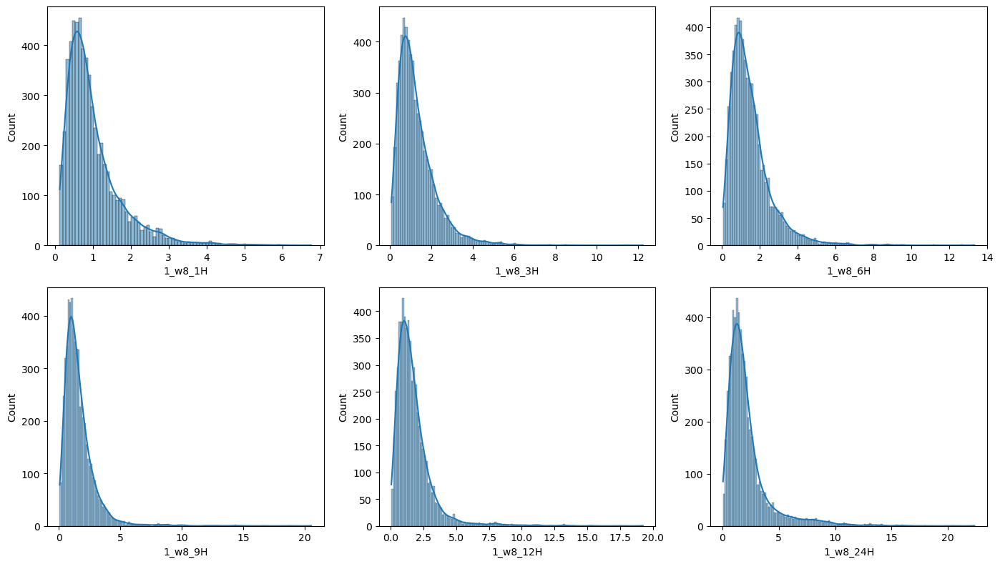

In [31]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w8_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w8_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w8_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w8_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w8_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w8_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

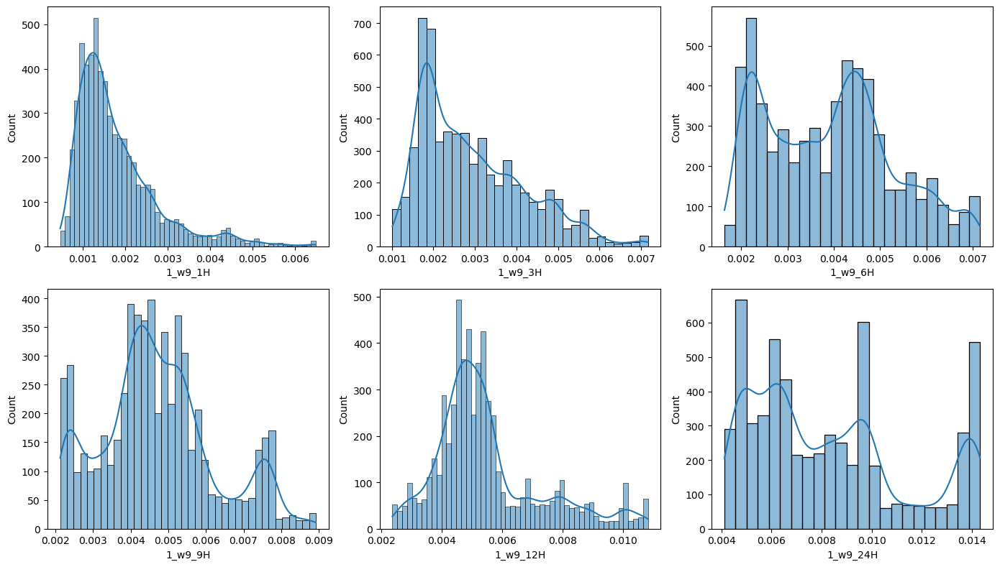

In [32]:
plt.rcParams.update({'figure.figsize': (14, 8), 'figure.dpi': 100})

fig, axes = plt.subplots(2, 3)

sns.histplot(data=X_train['1_w9_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_train['1_w9_3H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_train['1_w9_6H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w9_9H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_train['1_w9_12H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_train['1_w9_24H'], kde=True, ax=axes[1, 2])

plt.tight_layout()
plt.show()

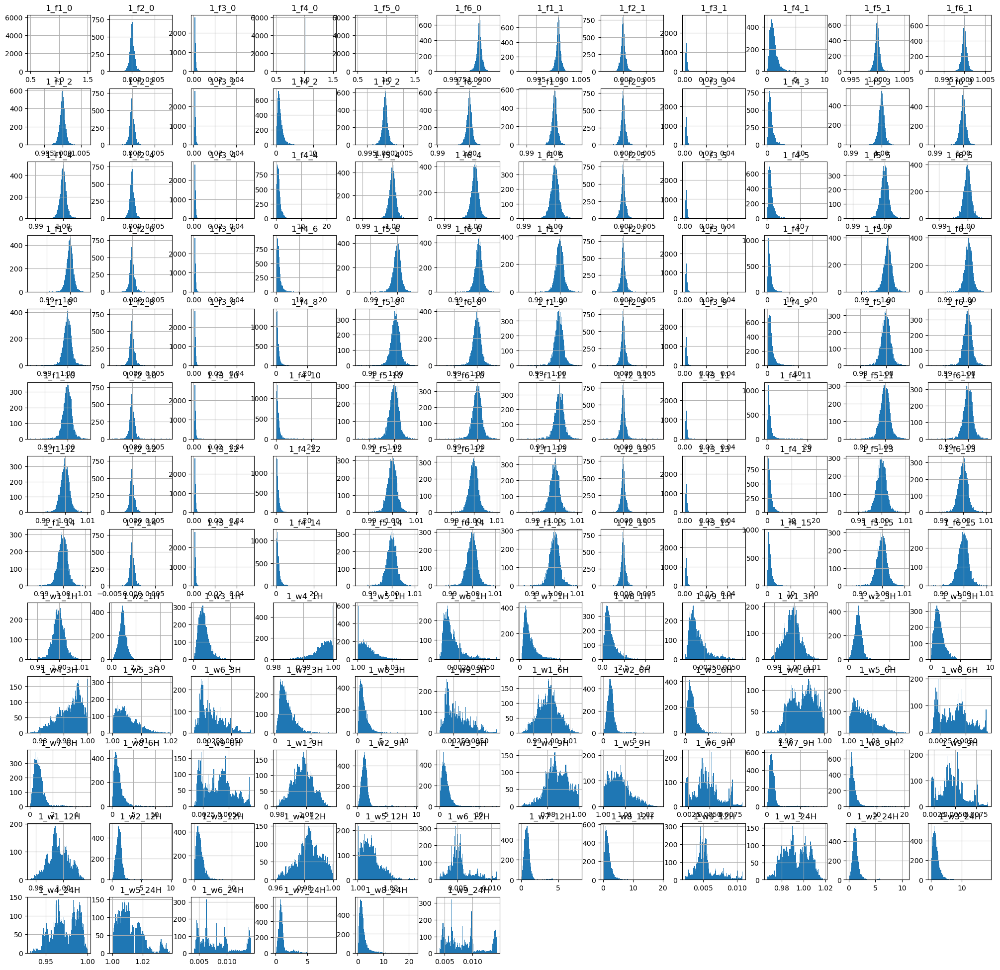

In [22]:
plt.rcParams.update({'figure.figsize': (25,25), 'figure.dpi': 100})

hist = X_train.hist(bins=100)

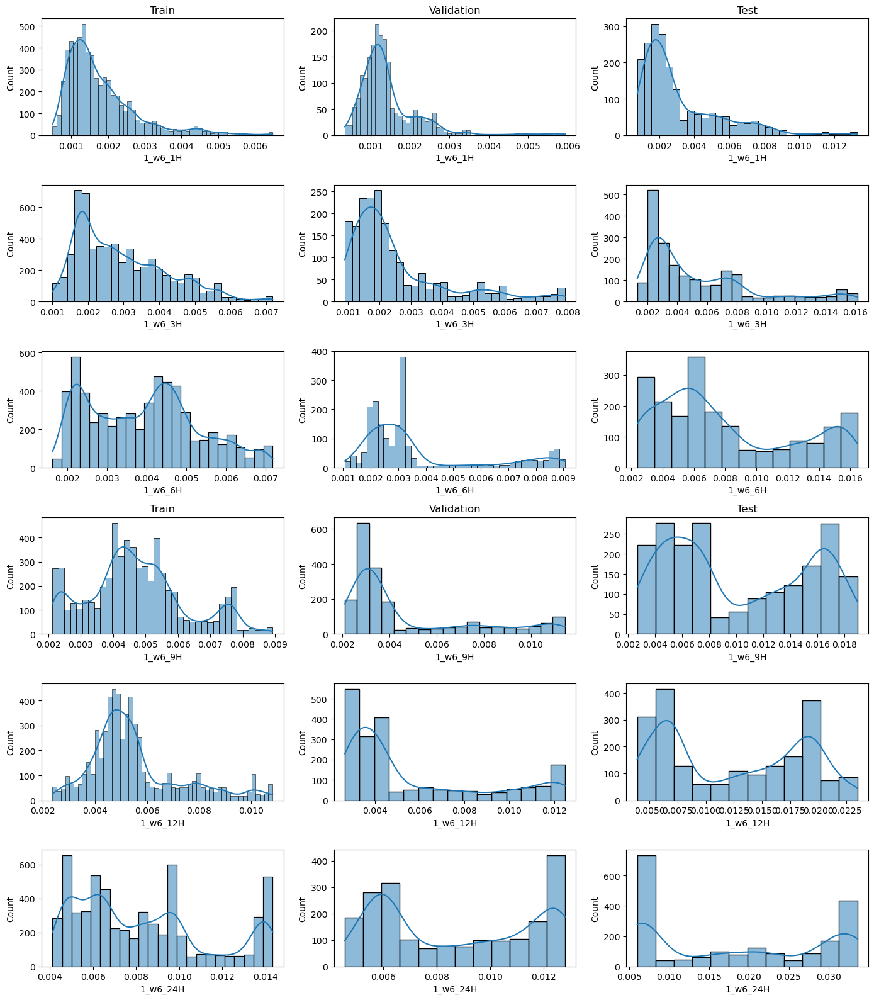

In [17]:
plt.rcParams.update({'figure.figsize': (14, 16), 'figure.dpi': 100})

fig, axes = plt.subplots(6, 3)

sns.histplot(data=X_train['1_w6_1H'], kde=True, ax=axes[0, 0])
sns.histplot(data=X_val['1_w6_1H'], kde=True, ax=axes[0, 1])
sns.histplot(data=X_test['1_w6_1H'], kde=True, ax=axes[0, 2])
sns.histplot(data=X_train['1_w6_3H'], kde=True, ax=axes[1, 0])
sns.histplot(data=X_val['1_w6_3H'], kde=True, ax=axes[1, 1])
sns.histplot(data=X_test['1_w6_3H'], kde=True, ax=axes[1, 2])
sns.histplot(data=X_train['1_w6_6H'], kde=True, ax=axes[2, 0])
sns.histplot(data=X_val['1_w6_6H'], kde=True, ax=axes[2, 1])
sns.histplot(data=X_test['1_w6_6H'], kde=True, ax=axes[2, 2])
sns.histplot(data=X_train['1_w6_9H'], kde=True, ax=axes[3, 0])
sns.histplot(data=X_val['1_w6_9H'], kde=True, ax=axes[3, 1])
sns.histplot(data=X_test['1_w6_9H'], kde=True, ax=axes[3, 2])
sns.histplot(data=X_train['1_w6_12H'], kde=True, ax=axes[4, 0])
sns.histplot(data=X_val['1_w6_12H'], kde=True, ax=axes[4, 1])
sns.histplot(data=X_test['1_w6_12H'], kde=True, ax=axes[4, 2])
sns.histplot(data=X_train['1_w6_24H'], kde=True, ax=axes[5, 0])
sns.histplot(data=X_val['1_w6_24H'], kde=True, ax=axes[5, 1])
sns.histplot(data=X_test['1_w6_24H'], kde=True, ax=axes[5, 2])

axes[0,0].set_title("Train")
axes[0,1].set_title("Validation")
axes[0,2].set_title("Test")
axes[3,0].set_title("Train")
axes[3,1].set_title("Validation")
axes[3,2].set_title("Test")

plt.tight_layout()
plt.show()

### default and RandomCV comparison

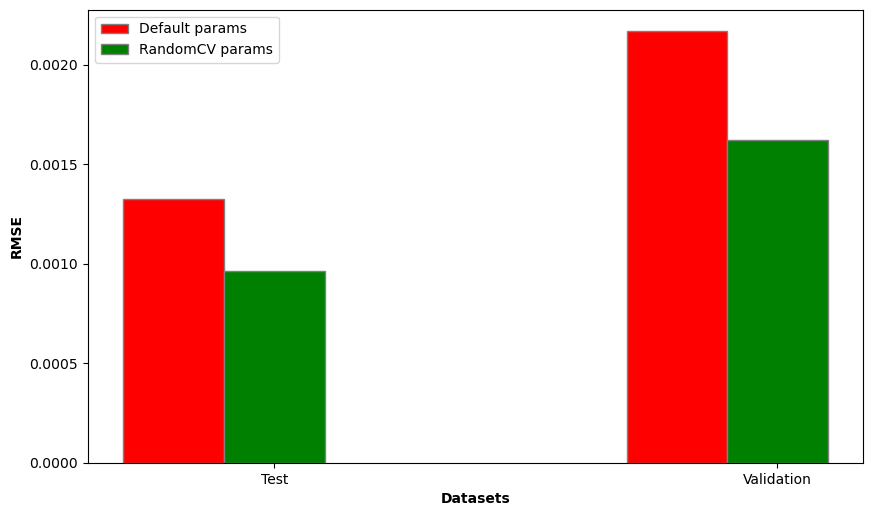

In [30]:
# plt.rcParams.update({'figure.figsize':(10,6), 'figure.dpi':100})
#
# barWidth = 0.2
#
# bar1_data = [rmse_val, rmse_test]
# bar2_data = [rmse_val_rand, rmse_test_rand]
#
# br1 = np.arange(len(bar1_data))
# br2 = [x + barWidth for x in br1]
#
# plt.bar(br1, bar1_data, color = 'r', width=barWidth, edgecolor = 'grey', label = 'Default params')
# plt.bar(br2, bar2_data, color = 'g', width=barWidth, edgecolor = 'grey', label = 'RandomCV params')
#
# plt.xlabel('Datasets', fontweight ='bold', fontsize = 10)
# plt.ylabel('RMSE', fontweight ='bold', fontsize = 10)
# plt.xticks([r + barWidth for r in range(len(bar1_data))],
#            ['Test', 'Validation'])
#
# plt.legend()
# plt.show()

In [22]:
# val_score_diff = rmse_val - rmse_val_rand
# color = Fore.GREEN if val_score_diff > 0.0 else Fore.RED
# print('Validation dataset score difference(Default -> RandomCV): ', color + str(rmse_val_rand))
# print(Style.RESET_ALL)
#
# test_score_diff = rmse_test - rmse_test_rand
# color = Fore.GREEN if test_score_diff > 0.0 else Fore.RED
# print('Test dataset score difference(Default -> RandomCV): ', color + str(rmse_test_rand))

Validation dataset score difference(Default -> RandomCV):  0.0009603200949387597

Test dataset score difference(Default -> RandomCV):  0.0016175019409544013
